# Zomato EDA and Market Analysis

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline 

import warnings
warnings.filterwarnings("ignore")

In [2]:
rc = {'figure.dpi': 100, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FAFAD2', 'grid.color': 'Red','figure.figsize':(12,8),
                    'figure.facecolor': '#FAFAD2'}
sns.set_theme(context='notebook',
              style='dark',
              palette='deep',
              font='Comic Sans Ms',
              font_scale=1.5,
              color_codes='red',
              rc=rc)

plt.rcParams['legend.fontsize'] = 10
plt.rcParams['font.size'] = 15
plt.rcParams['font.family'] = 'Comic Sans Ms'  
plt.rcParams['axes.facecolor'] = '#FAFAD2'
plt.rcParams["axes.labelcolor"] = '#FAFAD2'

In [5]:
pd.set_option("display.max_columns",None)

In [6]:
df = pd.read_csv('zomato.csv.zip')
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [151]:
df = df.drop(['url', 'address', 'phone', 'menu_item', 'reviews_list', 'dish_liked'], axis=1, errors='ignore')


In [9]:
df.shape

(51717, 11)

In [10]:
(df.isnull().sum()/df.shape[0])*100

name                            0.000000
online_order                    0.000000
book_table                      0.000000
rate                           15.033741
votes                           0.000000
location                        0.040606
rest_type                       0.438927
cuisines                        0.087012
approx_cost(for two people)     0.669026
listed_in(type)                 0.000000
listed_in(city)                 0.000000
dtype: float64

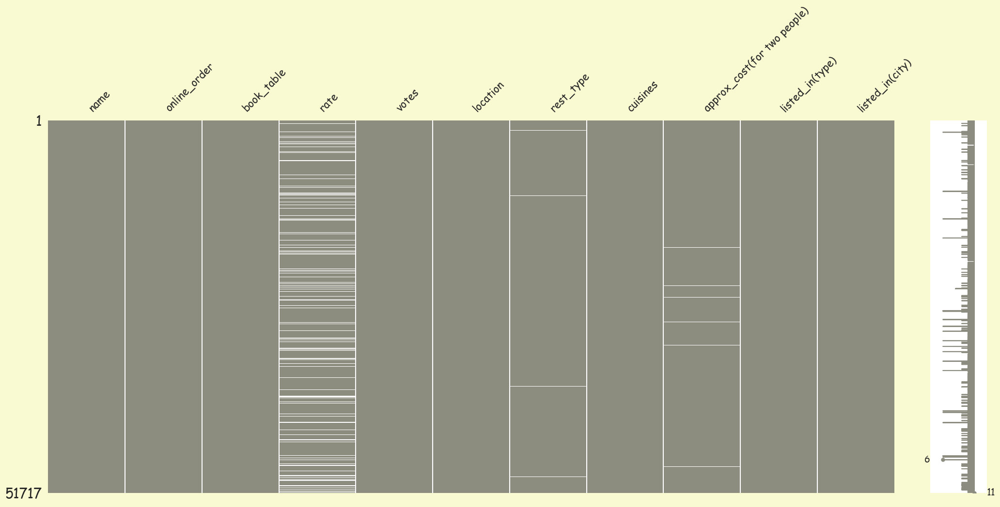

In [12]:
import missingno as msno
msno.matrix(df,color=(0.55, 0.55, 0.5));

In [13]:
df.dropna(inplace=True)

Information about the Dataset

In [14]:
# --- Print Dataset Detail ---
print('\033[7m'+'.: Dataset Details :.')
print('\033[0m\033[43m*' * 47 +'\033[0m')
df.info(memory_usage = False)

.: Dataset Details :.
***********************************************
<class 'pandas.core.frame.DataFrame'>
Index: 43533 entries, 0 to 51716
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   name                         43533 non-null  object
 1   online_order                 43533 non-null  object
 2   book_table                   43533 non-null  object
 3   rate                         43533 non-null  object
 4   votes                        43533 non-null  int64 
 5   location                     43533 non-null  object
 6   rest_type                    43533 non-null  object
 7   cuisines                     43533 non-null  object
 8   approx_cost(for two people)  43533 non-null  object
 9   listed_in(type)              43533 non-null  object
 10  listed_in(city)              43533 non-null  object
dtypes: int64(1), object(10)

In [15]:
(df.online_order.value_counts()/df.shape[0])*100

online_order
Yes    64.783038
No     35.216962
Name: count, dtype: float64

In [16]:
print(f"\033[031m\033[1m")
print(df['rate'].unique())


['4.1/5' '3.8/5' '3.7/5' '3.6/5' '4.6/5' '4.0/5' '4.2/5' '3.9/5' '3.1/5'
 '3.0/5' '3.2/5' '3.3/5' '2.8/5' '4.4/5' '4.3/5' 'NEW' '2.9/5' '3.5/5'
 '2.6/5' '3.8 /5' '3.4/5' '4.5/5' '2.5/5' '2.7/5' '4.7/5' '2.4/5' '2.2/5'
 '2.3/5' '3.4 /5' '-' '3.6 /5' '4.8/5' '3.9 /5' '4.2 /5' '4.0 /5' '4.1 /5'
 '3.7 /5' '3.1 /5' '2.9 /5' '3.3 /5' '2.8 /5' '3.5 /5' '2.7 /5' '2.5 /5'
 '3.2 /5' '2.6 /5' '4.5 /5' '4.3 /5' '4.4 /5' '4.9/5' '2.1/5' '2.0/5'
 '1.8/5' '4.6 /5' '4.9 /5' '3.0 /5' '4.8 /5' '2.3 /5' '4.7 /5' '2.4 /5'
 '2.1 /5' '2.2 /5' '2.0 /5' '1.8 /5']


Cleaning the Rating


In [17]:
def rate_clean(value):
    if(value=='NEW' or value=='-'):
        return np.nan
    else:
        value = str(value).split('/')
        value = value[0]
        return float(value)

In [18]:
print(f"\033[031m\033[1m")
df['rate'] = df['rate'].apply(rate_clean)
print(df['rate'].unique())


[4.1 3.8 3.7 3.6 4.6 4.  4.2 3.9 3.1 3.  3.2 3.3 2.8 4.4 4.3 nan 2.9 3.5
 2.6 3.4 4.5 2.5 2.7 4.7 2.4 2.2 2.3 4.8 4.9 2.1 2.  1.8]


In [19]:
df.dropna(inplace=True)

Giving Appropriate names to the Features


In [20]:
df.rename(columns = {'name':'Restaurant Name','online_order':'Online Order','book_table':'Book Table'}, inplace = True)
df.rename(columns = {'rate':'Ratings','votes':'Votes','location':'Location','rest_type':'Type Of Restaurant','cuisines':'Cuisines'}, inplace = True)
df.rename(columns = {'approx_cost(for two people)':'Cost For Two', 'listed_in(type)':'Catagory',"listed_in(city)" : "Listed in City"}, inplace = True)

In [21]:
df['Restaurant Name'] = df['Restaurant Name'].str.replace('Ã', '')
df['Restaurant Name'] = df['Restaurant Name'].str.replace('©', '')
df['Restaurant Name'] = df['Restaurant Name'].str.replace('Â', '')
df['Restaurant Name'] = df['Restaurant Name'].str.replace('', '')
df['Restaurant Name'] = df['Restaurant Name'].str.replace('', '')

Unique Location List in Bangalore

In [22]:
print(f"\033[034m\033[1m")
print("Unique Location List :")
print(f"\033[031m\033[1m")
print(df['Location'].unique())


Unique Location List :

['Banashankari' 'Basavanagudi' 'Mysore Road' 'Jayanagar'
 'Kumaraswamy Layout' 'Rajarajeshwari Nagar' 'Vijay Nagar' 'Uttarahalli'
 'JP Nagar' 'South Bangalore' 'City Market' 'Bannerghatta Road' 'BTM'
 'Kanakapura Road' 'Bommanahalli' 'Electronic City' 'Wilson Garden'
 'Shanti Nagar' 'Koramangala 5th Block' 'Richmond Road' 'HSR'
 'Koramangala 7th Block' 'Bellandur' 'Sarjapur Road' 'Marathahalli'
 'Whitefield' 'East Bangalore' 'Old Airport Road' 'Indiranagar'
 'Koramangala 1st Block' 'Frazer Town' 'MG Road' 'Brigade Road'
 'Lavelle Road' 'Church Street' 'Ulsoor' 'Residency Road' 'Shivajinagar'
 'Infantry Road' 'St. Marks Road' 'Cunningham Road' 'Race Course Road'
 'Commercial Street' 'Vasanth Nagar' 'Domlur' 'Koramangala 8th Block'
 'Ejipura' 'Jeevan Bhima Nagar' 'Old Madras Road' 'Seshadripuram'
 'Kammanahalli' 'Koramangala 6th Block' 'Majestic' 'Langford Town'
 'Central Bangalore' 'Brookefield' 'ITPL Main Road, Whitefield'
 'Varthur Main Road, Whitefield' 'Kora

Number of Restaurant Category

In [23]:
print(f"\033[034m\033[1m")
print(df["Catagory"].unique())
print(f"\033[035m\033[1m")
print("Categories Count :")
df["Catagory"].value_counts()


['Buffet' 'Cafes' 'Delivery' 'Desserts' 'Dine-out' 'Drinks & nightlife'
 'Pubs and bars']

Categories Count :


Catagory
Delivery              20452
Dine-out              14066
Desserts               2709
Cafes                  1511
Drinks & nightlife     1045
Buffet                  848
Pubs and bars           632
Name: count, dtype: int64

In [24]:
df.isnull().sum()

Restaurant Name       0
Online Order          0
Book Table            0
Ratings               0
Votes                 0
Location              0
Type Of Restaurant    0
Cuisines              0
Cost For Two          0
Catagory              0
Listed in City        0
dtype: int64

In [25]:
df.shape

(41263, 11)

In [26]:
df.dtypes

Restaurant Name        object
Online Order           object
Book Table             object
Ratings               float64
Votes                   int64
Location               object
Type Of Restaurant     object
Cuisines               object
Cost For Two           object
Catagory               object
Listed in City         object
dtype: object

Converting Cost of Two to Cost per Head

In [27]:
#Changing Cost per head from cost of 2
df['Cost For Two']=df['Cost For Two'].str.replace(',','')
df['Cost For Two']=df['Cost For Two'].astype(float)
df['Cost For Two']=df['Cost For Two'].apply(lambda x: x/2)
df.rename(columns = {'Cost For Two':'Cost Per Head'}, inplace = True)

In [28]:
ty=df['Type Of Restaurant'].value_counts(ascending  = False)
np.mean(ty)

np.float64(474.28735632183907)

In [29]:
typeLessThan10=ty[ty<10]
typeLessThan10

Type Of Restaurant
Bar, Quick Bites              9
Microbrewery, Lounge          9
Food Court, Dessert Parlor    8
Casual Dining, Sweet Shop     8
Bar, Lounge                   6
Food Court, Casual Dining     5
Bar, Pub                      5
Fine Dining, Microbrewery     5
Quick Bites, Mess             4
Quick Bites, Meat Shop        4
Club, Casual Dining           4
Casual Dining, Quick Bites    4
Bhojanalya                    3
Cafe, Food Court              2
Dessert Parlor, Kiosk         2
Bakery, Food Court            2
Dessert Parlor, Food Court    2
Food Court, Beverage Shop     2
Bakery, Beverage Shop         1
Quick Bites, Kiosk            1
Name: count, dtype: int64

In [30]:
def cleanTypeOfRestaurant(value):
    if(value in typeLessThan10):
        return 'others'
    else:
        return value

df['Type Of Restaurant']=df['Type Of Restaurant'].apply(cleanTypeOfRestaurant)
df['Type Of Restaurant'].value_counts()

Type Of Restaurant
Quick Bites                   13885
Casual Dining                  9614
Cafe                           3369
Dessert Parlor                 1850
Delivery                       1667
                              ...  
Confectionery                    15
Fine Dining, Lounge              14
Microbrewery, Bar                13
Dessert Parlor, Sweet Shop       12
Casual Dining, Lounge            10
Name: count, Length: 68, dtype: int64

In [31]:
location = df['Location'].value_counts(ascending  = False)
location_lessthan10 = location[location<10]
def cleanlocation(value):
    if(value in location_lessthan10):
        return 'others'
    else:
        return value
df['Location'] = df['Location'].apply(cleanlocation)
df['Location'].value_counts()

Location
BTM                      3879
Koramangala 5th Block    2297
HSR                      1993
Indiranagar              1800
JP Nagar                 1710
                         ... 
Old Madras Road            22
Kanakapura Road            19
Mysore Road                17
North Bangalore            10
KR Puram                   10
Name: count, Length: 84, dtype: int64

Top 10 Unique Cuisines by Numbers

In [32]:
cuisines = df['Cuisines'].value_counts(ascending  = False)
cuisines_lessthan1 = cuisines[cuisines<1]

def cleancuisines(value):
    if(value in cuisines_lessthan1):
        return 'others'
    else:
        return value
        
df['Cuisines'] = df['Cuisines'].apply(cleancuisines)
df['Cuisines'].value_counts()

Cuisines
North Indian                               2108
North Indian, Chinese                      1953
South Indian                               1232
Cafe                                        620
Bakery, Desserts                            613
                                           ... 
North Indian, Lucknowi, Afghan                1
Italian, North Indian, Continental, BBQ       1
Tibetan, Nepalese                             1
North Indian, Street Food, Biryani            1
North Indian, Chinese, Arabian, Momos         1
Name: count, Length: 2367, dtype: int64

In [33]:
print(df[['Catagory']].nunique())
print(df['Catagory'].unique())

Catagory    7
dtype: int64
['Buffet' 'Cafes' 'Delivery' 'Desserts' 'Dine-out' 'Drinks & nightlife'
 'Pubs and bars']


In [34]:
df.head(2)

,Restaurant Name,Online Order,Book Table,Ratings,Votes,Location,Type Of Restaurant,Cuisines,Cost Per Head,Catagory,Listed in City
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",400.0,Buffet,Banashankari
1,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",400.0,Buffet,Banashankari


Top 10 unique Restaurant Names by numbers

In [35]:
print(f"\033[031m\033[1m")
print("Unique Restaurant Names :", df['Restaurant Name'].nunique())

(
    df['Restaurant Name']
    .value_counts()
    .nlargest(10)
    .to_frame()
    .style
    .background_gradient(cmap='copper')
    .format(precision=2)
)



Unique Restaurant Names : 6574


,count
Restaurant Name,
Cafe Coffee Day,86
Onesta,85
Empire Restaurant,69
Kanti Sweets,68
Five Star Chicken,68
Just Bake,67
Baskin Robbins,62
Pizza Hut,60
Petoo,60


In [36]:
print(f"\033[031m\033[1m")
print("Unique Type Of Restaurant :", df['Type Of Restaurant'].nunique())
(
    df['Type Of Restaurant']
    .value_counts()
    .nlargest(10)
    .to_frame()
    .style
    .background_gradient(cmap='copper')
    .format(precision=2)  # Use .format instead of .set_precision
)



Unique Type Of Restaurant : 68


,count
Type Of Restaurant,
Quick Bites,13885
Casual Dining,9614
Cafe,3369
Dessert Parlor,1850
Delivery,1667
"Takeaway, Delivery",1279
"Casual Dining, Bar",1092
Bakery,704
Bar,640


In [37]:
df.isnull().sum()

Restaurant Name       0
Online Order          0
Book Table            0
Ratings               0
Votes                 0
Location              0
Type Of Restaurant    0
Cuisines              0
Cost Per Head         0
Catagory              0
Listed in City        0
dtype: int64

In [38]:
df.shape

(41263, 11)

In [39]:
df.dtypes

Restaurant Name        object
Online Order           object
Book Table             object
Ratings               float64
Votes                   int64
Location               object
Type Of Restaurant     object
Cuisines               object
Cost Per Head         float64
Catagory               object
Listed in City         object
dtype: object

In [40]:
df.columns = df.columns.str.strip()  # Remove extra spaces

# Confirm column name
print(df.columns)

# Proceed if it exists
if 'Cost For Two' in df.columns:
    df['Cost For Two'] = df['Cost For Two'].str.replace(',', '')
    df['Cost For Two'] = df['Cost For Two'].astype(float)
    df['Cost For Two'] = df['Cost For Two'] / 2
    df.rename(columns={'Cost For Two': 'Cost Per Head'}, inplace=True)
else:
    print("Column 'Cost For Two' not found.")


Index(['Restaurant Name', 'Online Order', 'Book Table', 'Ratings', 'Votes',
       'Location', 'Type Of Restaurant', 'Cuisines', 'Cost Per Head',
       'Catagory', 'Listed in City'],
      dtype='object')
Column 'Cost For Two' not found.


In [41]:
ty=df['Type Of Restaurant'].value_counts(ascending  = False)
np.mean(ty)

np.float64(606.8088235294117)

In [42]:
typeLessThan10=ty[ty<10]
typeLessThan10

Series([], Name: count, dtype: int64)

In [43]:
def cleanTypeOfRestaurant(value):
    if(value in typeLessThan10):
        return 'others'
    else:
        return value

df['Type Of Restaurant']=df['Type Of Restaurant'].apply(cleanTypeOfRestaurant)
df['Type Of Restaurant'].value_counts()

Type Of Restaurant
Quick Bites                   13885
Casual Dining                  9614
Cafe                           3369
Dessert Parlor                 1850
Delivery                       1667
                              ...  
Confectionery                    15
Fine Dining, Lounge              14
Microbrewery, Bar                13
Dessert Parlor, Sweet Shop       12
Casual Dining, Lounge            10
Name: count, Length: 68, dtype: int64

In [44]:
location = df['Location'].value_counts(ascending  = False)
location_lessthan10 = location[location<10]
def cleanlocation(value):
    if(value in location_lessthan10):
        return 'others'
    else:
        return value
df['Location'] = df['Location'].apply(cleanlocation)
df['Location'].value_counts()

Location
BTM                      3879
Koramangala 5th Block    2297
HSR                      1993
Indiranagar              1800
JP Nagar                 1710
                         ... 
Old Madras Road            22
Kanakapura Road            19
Mysore Road                17
North Bangalore            10
KR Puram                   10
Name: count, Length: 84, dtype: int64

In [45]:
cuisines = df['Cuisines'].value_counts(ascending  = False)
cuisines_lessthan1 = cuisines[cuisines<1]

def cleancuisines(value):
    if(value in cuisines_lessthan1):
        return 'others'
    else:
        return value
        
df['Cuisines'] = df['Cuisines'].apply(cleancuisines)
df['Cuisines'].value_counts()

Cuisines
North Indian                               2108
North Indian, Chinese                      1953
South Indian                               1232
Cafe                                        620
Bakery, Desserts                            613
                                           ... 
North Indian, Lucknowi, Afghan                1
Italian, North Indian, Continental, BBQ       1
Tibetan, Nepalese                             1
North Indian, Street Food, Biryani            1
North Indian, Chinese, Arabian, Momos         1
Name: count, Length: 2367, dtype: int64

In [46]:
print(df[['Catagory']].nunique())
print(df['Catagory'].unique())

Catagory    7
dtype: int64
['Buffet' 'Cafes' 'Delivery' 'Desserts' 'Dine-out' 'Drinks & nightlife'
 'Pubs and bars']


In [47]:
df.head(2)

,Restaurant Name,Online Order,Book Table,Ratings,Votes,Location,Type Of Restaurant,Cuisines,Cost Per Head,Catagory,Listed in City
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",400.0,Buffet,Banashankari
1,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",400.0,Buffet,Banashankari


In [48]:
print(f"\033[031m\033[1m")
print("Unique Restaurant Names :", df['Restaurant Name'].nunique())

df['Restaurant Name'].value_counts().nlargest(10).to_frame() \
    .style.background_gradient(cmap='copper').format("{:.2f}")



Unique Restaurant Names : 6574


,count
Restaurant Name,
Cafe Coffee Day,86.00
Onesta,85.00
Empire Restaurant,69.00
Kanti Sweets,68.00
Five Star Chicken,68.00
Just Bake,67.00
Baskin Robbins,62.00
Pizza Hut,60.00
Petoo,60.00


In [49]:
print(f"\033[031m\033[1m")
print("Unique Type Of Restaurant :", df['Type Of Restaurant'].nunique())

df['Type Of Restaurant'].value_counts().nlargest(10).to_frame() \
    .style.background_gradient(cmap='copper')



Unique Type Of Restaurant : 68


,count
Type Of Restaurant,
Quick Bites,13885
Casual Dining,9614
Cafe,3369
Dessert Parlor,1850
Delivery,1667
"Takeaway, Delivery",1279
"Casual Dining, Bar",1092
Bakery,704
Bar,640


In [50]:
print(f"\033[031m\033[1m")
print("Unique Catagory :", df['Catagory'].nunique())

df['Catagory'].value_counts().nlargest(10).to_frame() \
    .style.background_gradient(cmap='copper')



Unique Catagory : 7


,count
Catagory,
Delivery,20452
Dine-out,14066
Desserts,2709
Cafes,1511
Drinks & nightlife,1045
Buffet,848
Pubs and bars,632


In [51]:
print(f"\033[031m\033[1m")
print("Unique Cuisines :", df['Cuisines'].nunique())

df['Cuisines'].value_counts().nlargest(10).to_frame().style.background_gradient(cmap='copper')



Unique Cuisines : 2367


,count
Cuisines,
North Indian,2108
"North Indian, Chinese",1953
South Indian,1232
Cafe,620
"Bakery, Desserts",613
Biryani,600
"South Indian, North Indian, Chinese",561
Desserts,545
Fast Food,514


WordCloud for Cuisines

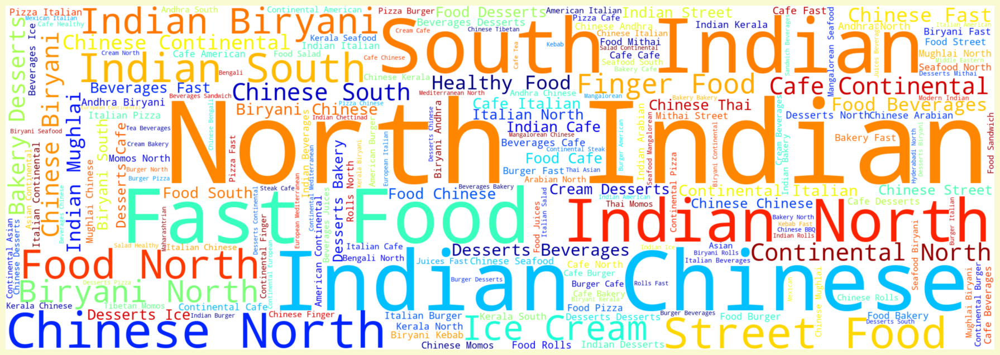

In [52]:
from wordcloud import WordCloud, STOPWORDS

text = " ".join(Company for Company in df["Cuisines"])
#font = "Quicksand-Bold.ttf"
word_cloud = WordCloud(width = 2300,
                       height = 800,
                       colormap = 'jet',
                       background_color = "white").generate(text)
plt.figure(figsize = (50, 8))
plt.imshow(word_cloud, interpolation = "gaussian")
plt.axis("off")
plt.show()

3D Scatter Plot

In [53]:
# 3D Scatter Plot
import plotly.express as px
fig = px.scatter_3d(df, x='Catagory', z='Cost Per Head', y='Ratings', color='Online Order')
fig.show()

Top 10 Listed in City bt numbers

In [147]:
print(f"\033[031m\033[1m")
print("Unique Listed in City :", df['Listed in City'].nunique())
df['Listed in City'].value_counts().nlargest(10).to_frame() \
  .style.background_gradient(cmap='copper').format(precision=2)



Unique Listed in City : 30


,count
Listed in City,
BTM,2586
Koramangala 7th Block,2361
Koramangala 4th Block,2254
Koramangala 5th Block,2250
Koramangala 6th Block,2121
Jayanagar,1918
JP Nagar,1633
Indiranagar,1538
Church Street,1518


Percentage of Restaurant Listed in City

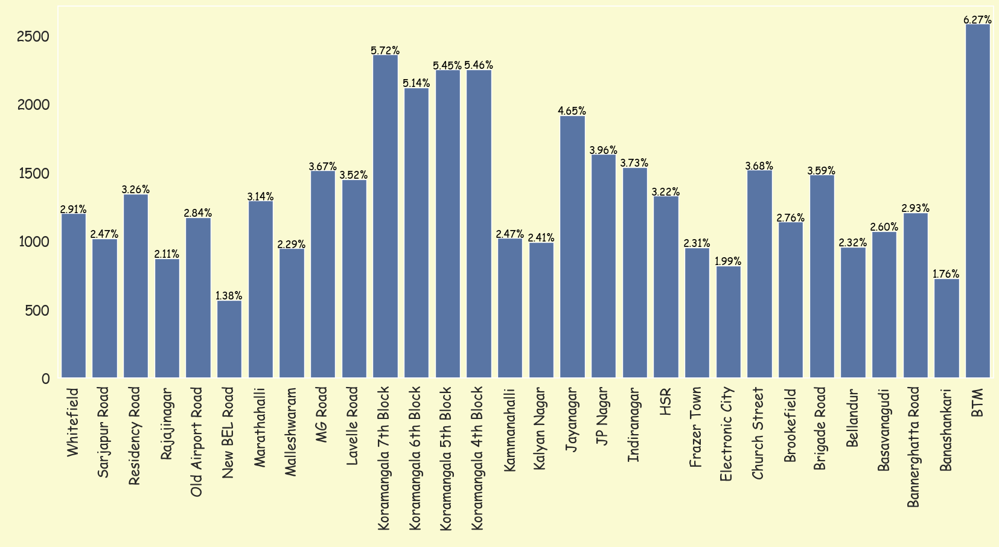

In [148]:
plt.figure(figsize = (20, 8))
s = sns.countplot(x = df['Listed in City'].sort_values(ascending=False),data = df)
sizes=[]
for p in s.patches:
    height = p.get_height()
    sizes.append(height)
    s.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/len(df)*100),
            ha="center", fontsize=12,color = "Black") 
    plt.xticks(rotation=90)


In [1]:
# BTM has the highest percentage (6.27% ) of restaurants in Bangalore.

In [ ]:
# New Bel Road has least percentage (1.38%) of restaurants in Bangalore.

# Banashankari has the second least percentage (1.76% ) of restaurants in Bangalore

Book table vs Cost per Head

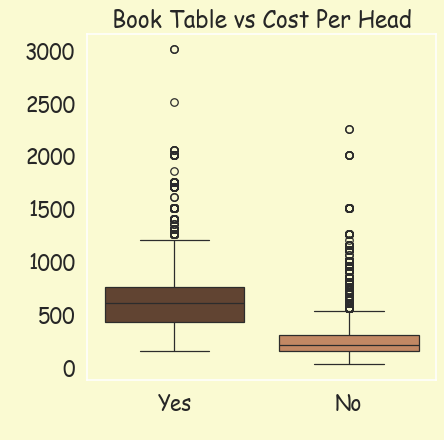

In [55]:
plt.figure(figsize=(5,5),dpi=90)
plt.title('Book Table vs Cost Per Head')
sns.boxplot(x='Book Table',y='Cost Per Head',data=df,palette='copper');

In [ ]:
# The restaurants which accepts booking have the highest cost per head as compared to those which do not accept booking.

In [ ]:
# If Restaurants want increase Cost Per Head sales they should start taking bookings.

Barplot for Category vs Cost per Head

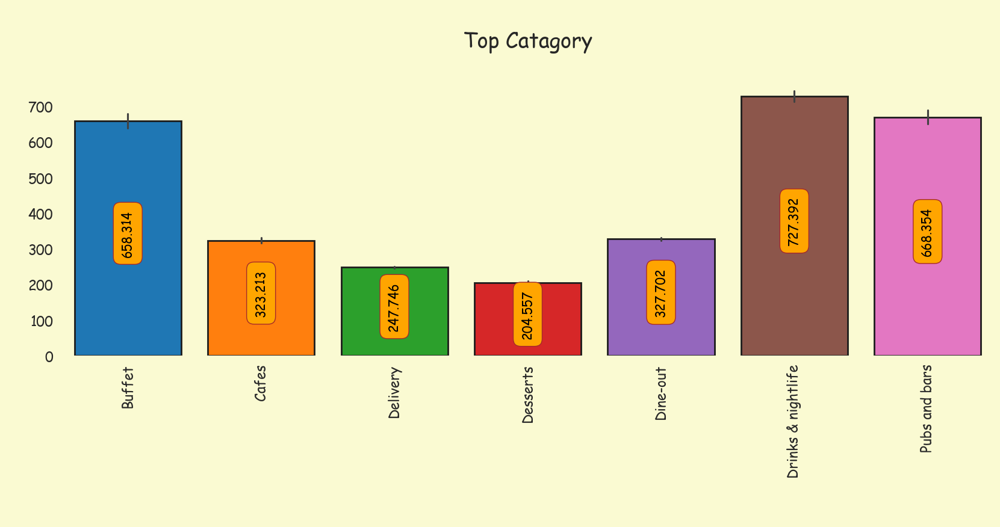

In [56]:
plt.subplots(figsize=(20,6))
p = sns.barplot(x=df["Catagory"],y=df["Cost Per Head"],palette='tab10', saturation=1, edgecolor = "#1c1c1c", linewidth = 2)
p.axes.set_title("\nTop Catagory\n", fontsize=25)
plt.ylabel("Cost Per Head" , fontsize = 20)
plt.xlabel("\nCatagory" , fontsize = 20)
# plt.yscale("log")
plt.xticks(rotation = 90)
for container in p.containers:
    p.bar_label(container,label_type = "center",padding = 6,size = 15,color = "black",rotation = 90,
    bbox={"boxstyle": "round", "pad": 0.6, "facecolor": "orange", "edgecolor": "Brown", "alpha": 1})

sns.despine(left=True, bottom=True)
plt.show()

Barplot for Type Of Restaurant Vs Mean Cost Per Head

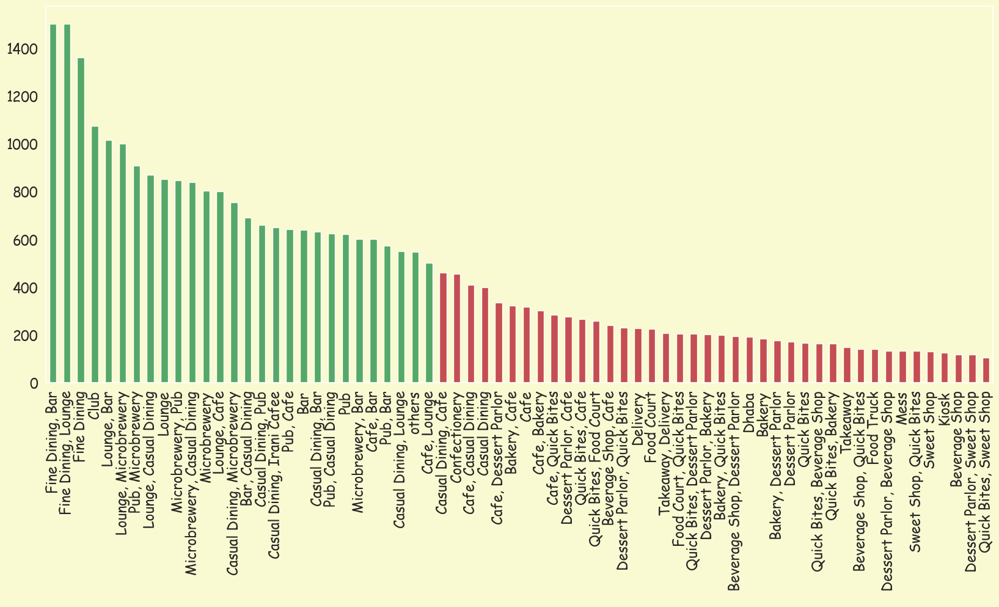

In [57]:
plt.figure(figsize = (20,8))
df2=df.groupby('Type Of Restaurant')['Cost Per Head'].mean().sort_values(ascending=False)
color = [('r' if i < 500 else 'g') for i in df2]
df2.plot.bar(color=color);

In [58]:
df[['Restaurant Name','Online Order','Book Table','Location','Type Of Restaurant','Cuisines','Catagory','Listed in City']].nunique()

Restaurant Name       6574
Online Order             2
Book Table               2
Location                84
Type Of Restaurant      68
Cuisines              2367
Catagory                 7
Listed in City          30
dtype: int64

Restaurant Category by total sum of (Ratings & Cost per Head)

In [145]:
df.reset_index().groupby('Catagory')[['Ratings', 'Cost Per Head']].agg('sum') \
  .style.background_gradient(cmap='copper').format(precision=2)


,Ratings,Cost Per Head
Catagory,,
Buffet,3376.20,558250.00
Cafes,5850.80,488375.00
Delivery,74753.80,5066908.00
Desserts,10237.50,554145.00
Dine-out,51798.40,4609450.00
Drinks & nightlife,4197.10,760125.00
Pubs and bars,2542.30,422400.00


Restaurant Category by Mean of (Ratings & Cost per Head)

In [144]:
df.groupby('Catagory')[['Ratings', 'Cost Per Head']].agg('mean') \
  .style.background_gradient(cmap='copper') \
  .format(precision=2)


,Ratings,Cost Per Head
Catagory,,
Buffet,3.98,658.31
Cafes,3.87,323.21
Delivery,3.66,247.75
Desserts,3.78,204.56
Dine-out,3.68,327.70
Drinks & nightlife,4.02,727.39
Pubs and bars,4.02,668.35


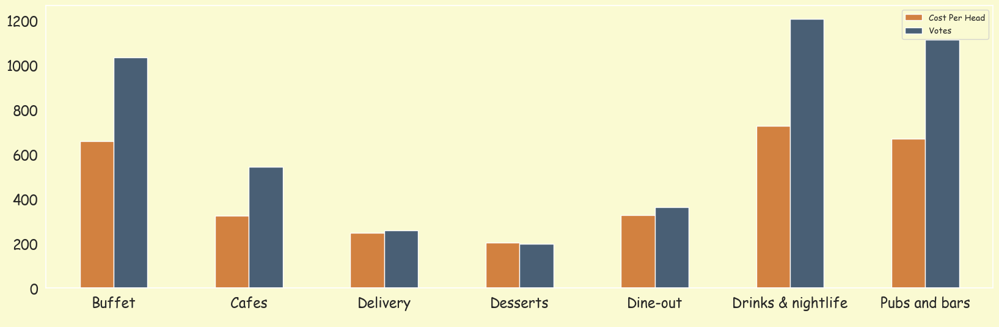

In [63]:
color = ['#D28140','#495F75']
df.groupby(["Catagory"])[['Cost Per Head','Votes']].mean().plot(kind="bar",figsize=(20,6),color=color);
plt.xticks(rotation=0);

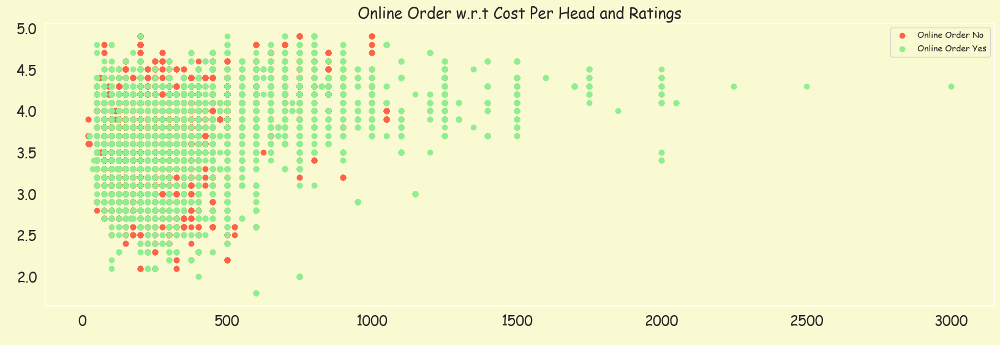

In [64]:
plt.figure(figsize=(20,6))

plt.scatter(df['Cost Per Head'][df['Online Order']=="Yes"], 
            df.Ratings[df['Online Order']=="Yes"], 
            c="tomato")

plt.scatter(df['Cost Per Head'][df['Online Order']=="No"], 
            df['Ratings'][df['Online Order']=="No"], 
            c="lightgreen")

plt.title("Online Order w.r.t Cost Per Head and Ratings")
plt.xlabel("Cost Per Head")
plt.legend(["Online Order No", "Online Order Yes"])
plt.ylabel("Ratings");

Top 10 Type Of Restaurant with Percentage

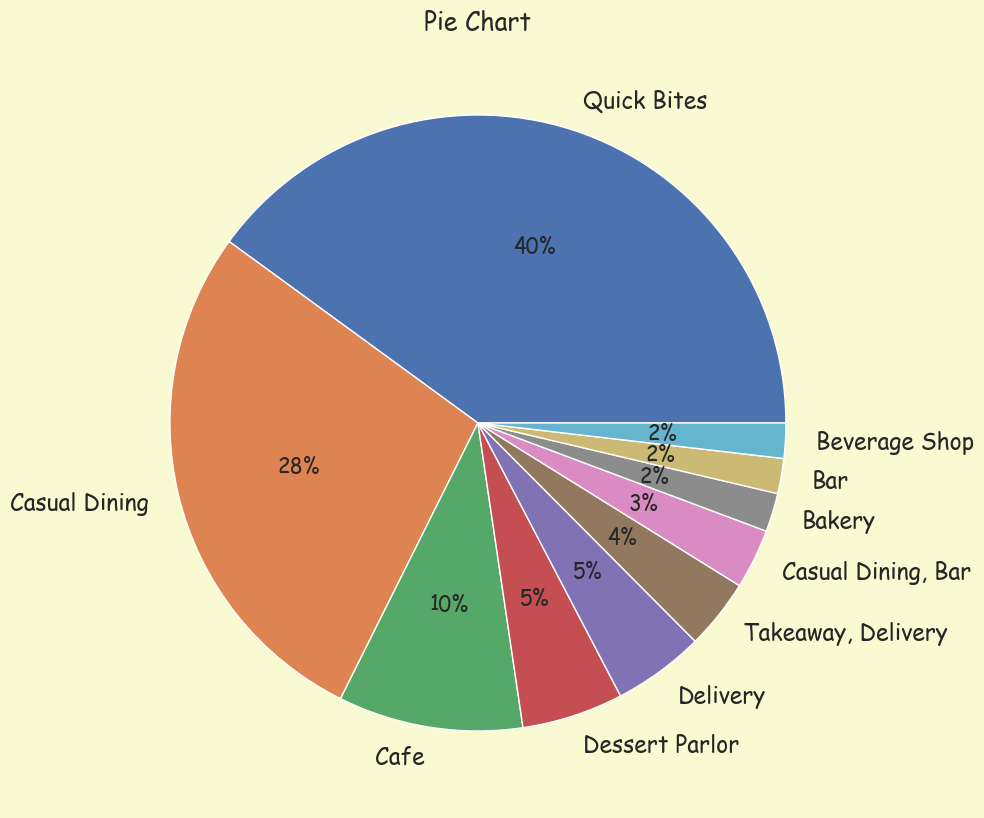

In [65]:
df["Type Of Restaurant"].value_counts()[:10].plot.pie(figsize = (10, 10),
                                             autopct = '%1.0f%%')
plt.title("Pie Chart")
plt.xticks(rotation = 90)
plt.show()

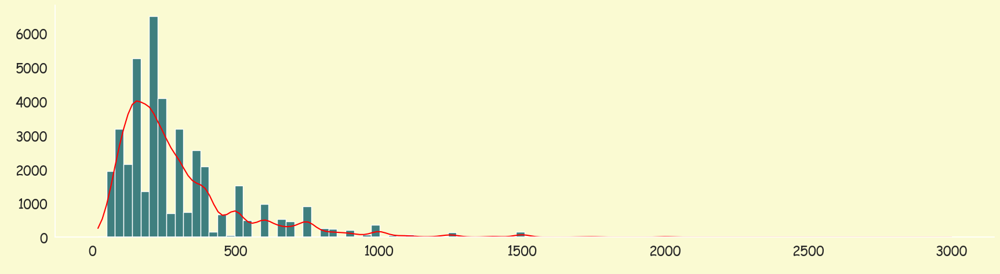

In [66]:
sns.displot(data=df, x="Cost Per Head", kde=True, bins = 100,color = "red", facecolor = "#3F7F7F",height = 5, aspect = 3.5);

Scatterplot Plot for Cost Per Head Vs Catagory

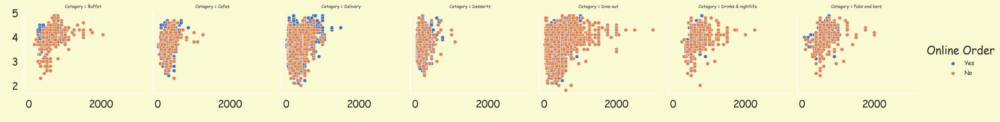

In [67]:
g = sns.FacetGrid(df, col="Catagory", hue="Online Order")
g.map_dataframe(sns.scatterplot, x="Cost Per Head", y="Ratings")
g.add_legend()
plt.show()

HistPlot for Cost Per Head Vs Catagory

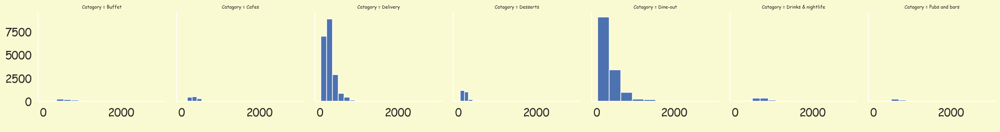

In [68]:
g = sns.FacetGrid(df, col="Catagory")
g = g.map(plt.hist, "Cost Per Head")

Top 50 Restaurant Chains in Bangalore by number of outlets

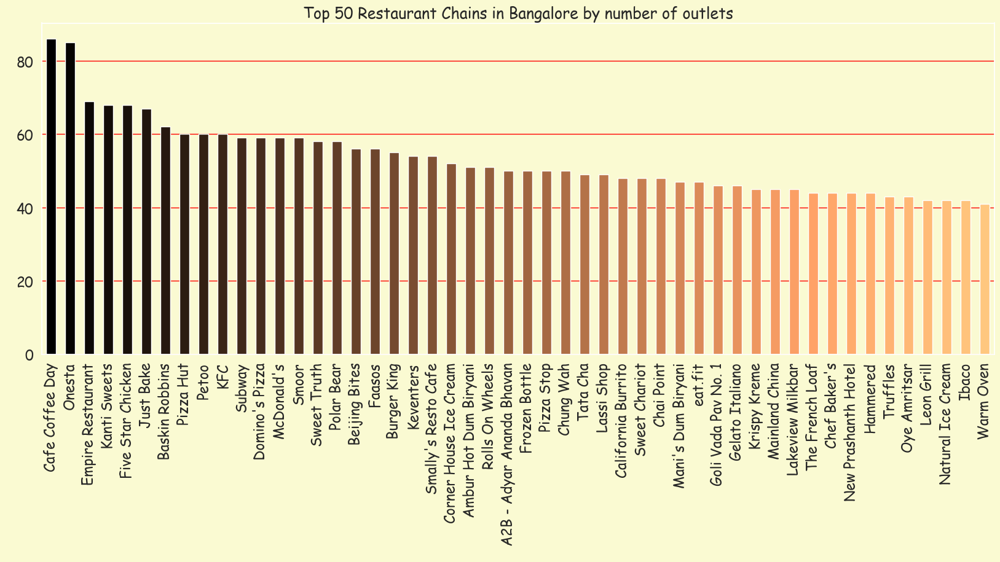

In [70]:
plt.figure(figsize=(20,7))
df['Restaurant Name'].value_counts()[:50].plot(kind = 'bar', color = plt.cm.copper(np.linspace(0, 1, 50)))
plt.title('Top 50 Restaurant Chains in Bangalore by number of outlets')
plt.xlabel('Restaurant name')
plt.ylabel("No of Outlets")
plt.grid(axis = 'y')
plt.xticks(rotation = 90);

Mean Cost Per Head spend by Customer in Location Listed in City

In [143]:
df_Listed = df.groupby(['Listed in City'])['Cost Per Head'].mean().reset_index()
df_Listed.sort_values(ascending=False, by='Cost Per Head') \
    .style.background_gradient(cmap='copper').format(precision=2)


,Listed in City,Cost Per Head
7,Church Street,424.00
5,Brigade Road,419.47
20,Lavelle Road,415.68
21,MG Road,415.36
27,Residency Road,409.74
11,Indiranagar,352.42
25,Old Airport Road,327.40
29,Whitefield,325.60
22,Malleshwaram,309.18
9,Frazer Town,305.15


Maximum Cost Per Head spend by Customer in Location Listed in City

In [142]:
df_Listed = df.groupby(['Listed in City'])['Cost Per Head'].max().reset_index()
df_Listed.sort_values(ascending=False, by='Cost Per Head') \
    .style.background_gradient(cmap='copper').format(precision=2)


,Listed in City,Cost Per Head
11,Indiranagar,3000.00
25,Old Airport Road,3000.00
22,Malleshwaram,2500.00
23,Marathahalli,2250.00
20,Lavelle Road,2050.00
5,Brigade Road,2000.00
7,Church Street,2000.00
27,Residency Road,2000.00
21,MG Road,2000.00
16,Koramangala 4th Block,1500.00


BarPlot of Location by Average Cost Per Head

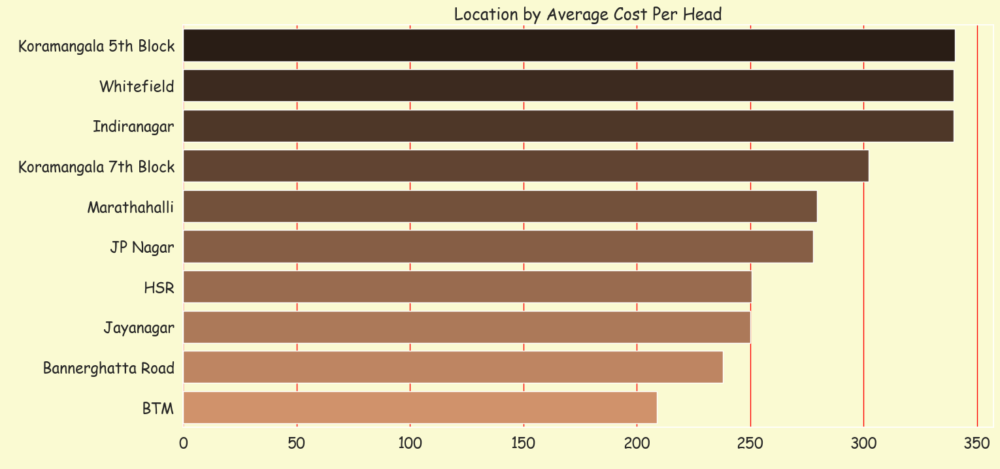

In [73]:
colors=sns.color_palette('copper')[0:5]
res_chain = df['Cost Per Head'].groupby(df['Location'],sort=True)
dict_2={}
for i,j in df['Location'].value_counts()[:10].to_dict().items():
    dict_2[i]=round(res_chain.get_group(i).mean(),2)
cost_df2 = pd.DataFrame(list(dict_2.items()),columns=['Location',"Average Cost Per Head"])


fig , ax = plt.subplots(figsize=(16,8))
sns.barplot(data = cost_df2.sort_values(by=['Average Cost Per Head'],ascending=False),
            x = 'Average Cost Per Head',y = 'Location',palette=sns.blend_palette(colors, n_colors=10))
plt.title('Location by Average Cost Per Head')
plt.grid(axis = 'x')

BarPlot of Restaurant Name (Lavelle Road) by Average Cost Per Head

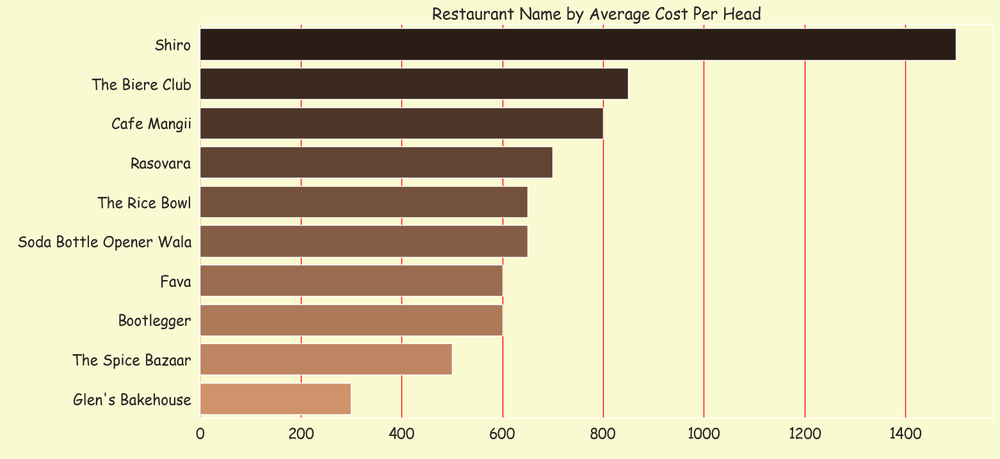

In [74]:
Low_cost_perhead = df[df['Location'] == "Lavelle Road"]
colors=sns.color_palette('copper')[0:5]
res_chain = Low_cost_perhead['Cost Per Head'].groupby(Low_cost_perhead['Restaurant Name'],sort=True)
dict_2={}
for i,j in Low_cost_perhead['Restaurant Name'].value_counts()[:10].to_dict().items():
    dict_2[i]=round(res_chain.get_group(i).mean(),2)
cost_df2 = pd.DataFrame(list(dict_2.items()),columns=['Restaurant Name',"Average Rating"])


fig , ax = plt.subplots(figsize=(16,8))
sns.barplot(data = cost_df2.sort_values(by=['Average Rating'],ascending=False),
            x = 'Average Rating',y = 'Restaurant Name',palette=sns.blend_palette(colors, n_colors=10))
plt.title('Restaurant Name by Average Cost Per Head')
plt.grid(axis = 'x')

WordCloud for Restaurant Name

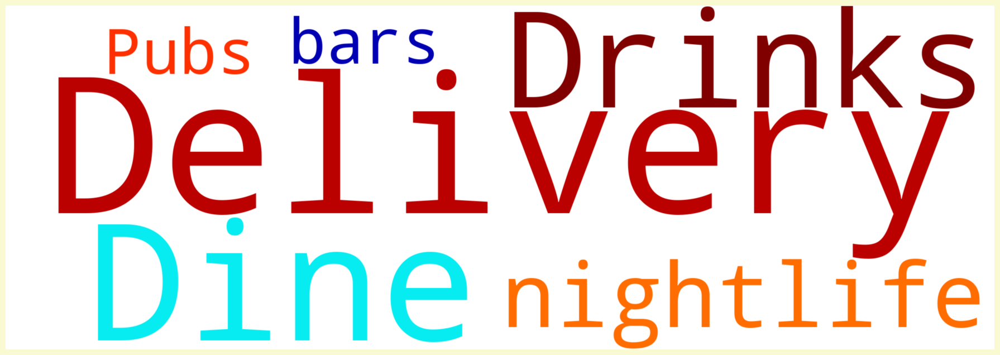

In [75]:
Le_Rock = df[df['Restaurant Name'] == 'Le Rock']
from wordcloud import WordCloud, STOPWORDS

text = " ".join(Company for Company in Le_Rock["Catagory"])
#font = "Quicksand-Bold.ttf"
word_cloud = WordCloud(width = 2300,
                       height = 800,
                       colormap = 'jet',
                       background_color = "white").generate(text)
plt.figure(figsize = (50, 8))
plt.imshow(word_cloud, interpolation = "gaussian")
plt.axis("off")
plt.show()

WordCloud for Restaurant Name

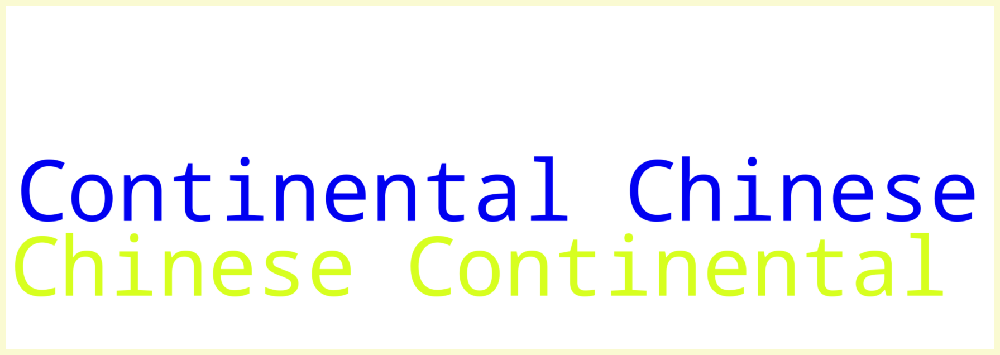

In [76]:
from wordcloud import WordCloud, STOPWORDS

text = " ".join(Company for Company in Le_Rock["Cuisines"])
#font = "Quicksand-Bold.ttf"
word_cloud = WordCloud(width = 2300,
                       height = 800,
                       colormap = 'jet',
                       background_color = "white").generate(text)
plt.figure(figsize = (50, 8))
plt.imshow(word_cloud, interpolation = "gaussian")
plt.axis("off")
plt.show()

WordCloud for Restaurant Name

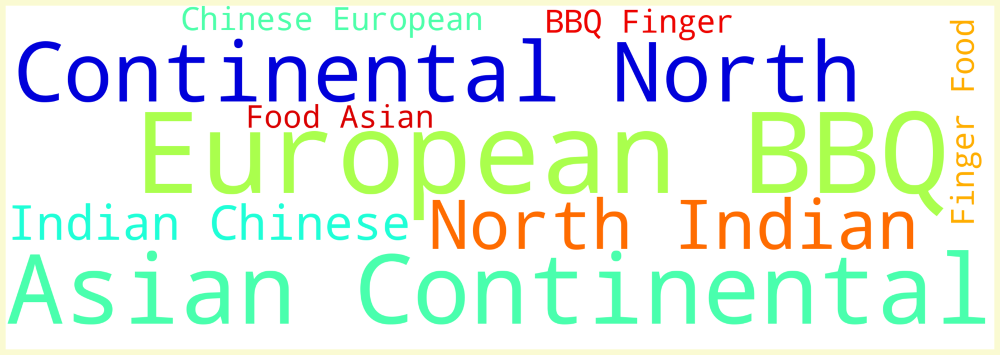

In [77]:
Biergarten = df[df['Restaurant Name'] == 'Biergarten']
from wordcloud import WordCloud, STOPWORDS

text = " ".join(Company for Company in Biergarten["Cuisines"])
#font = "Quicksand-Bold.ttf"
word_cloud = WordCloud(width = 2300,
                       height = 800,
                       colormap = 'jet',
                       background_color = "white").generate(text)
plt.figure(figsize = (50, 8))
plt.imshow(word_cloud, interpolation = "gaussian")
plt.axis("off")
plt.show()

Top Restaurants by Average Cost Per Head

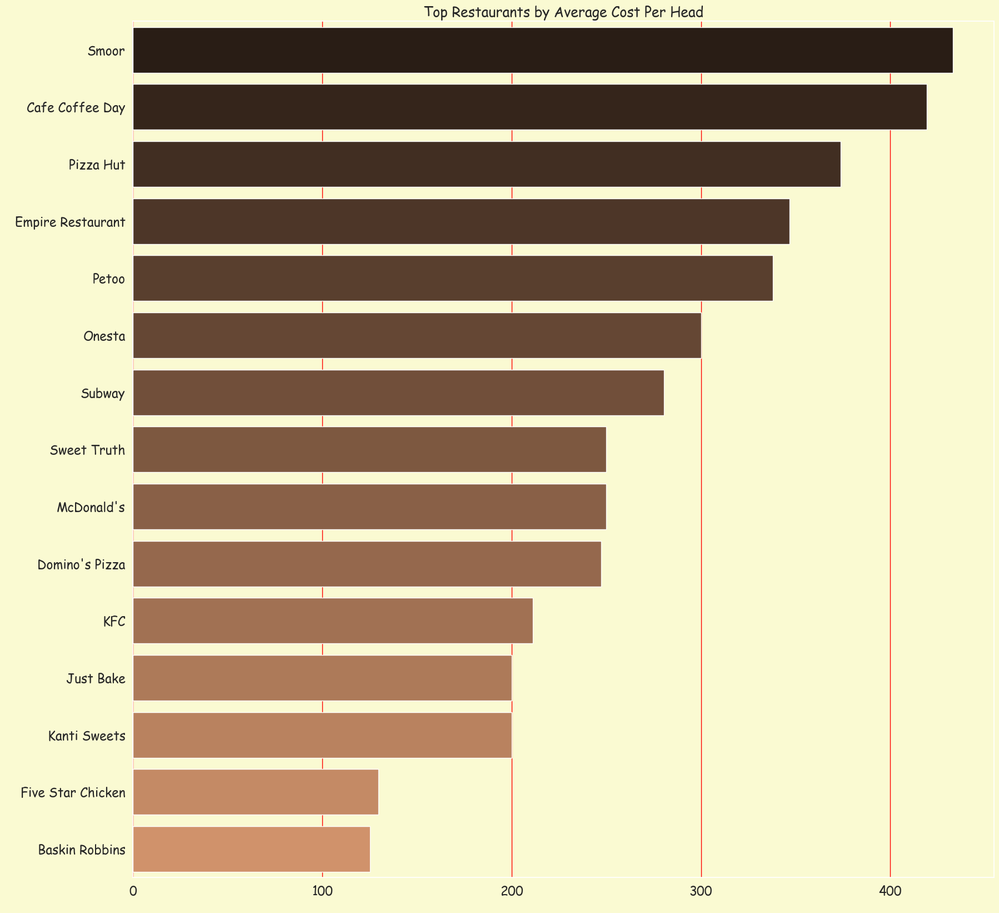

In [78]:
colors=sns.color_palette('copper')[0:5]
res_chain = df['Cost Per Head'].groupby(df['Restaurant Name'],sort=True)
dict_2={}
for i,j in df['Restaurant Name'].value_counts()[:15].to_dict().items():
    dict_2[i]=round(res_chain.get_group(i).mean(),2)
cost_df2 = pd.DataFrame(list(dict_2.items()),columns=['Restaurant Name',"Average Cost Per Head"])


fig , ax = plt.subplots(figsize=(20,20))
sns.barplot(data = cost_df2.sort_values(by=['Average Cost Per Head'],ascending=False),
            x = 'Average Cost Per Head',y = 'Restaurant Name',palette=sns.blend_palette(colors, n_colors=15))
plt.title('Top Restaurants by Average Cost Per Head')
plt.grid(axis = 'x')

Top Voted Restaurants in Bangalore

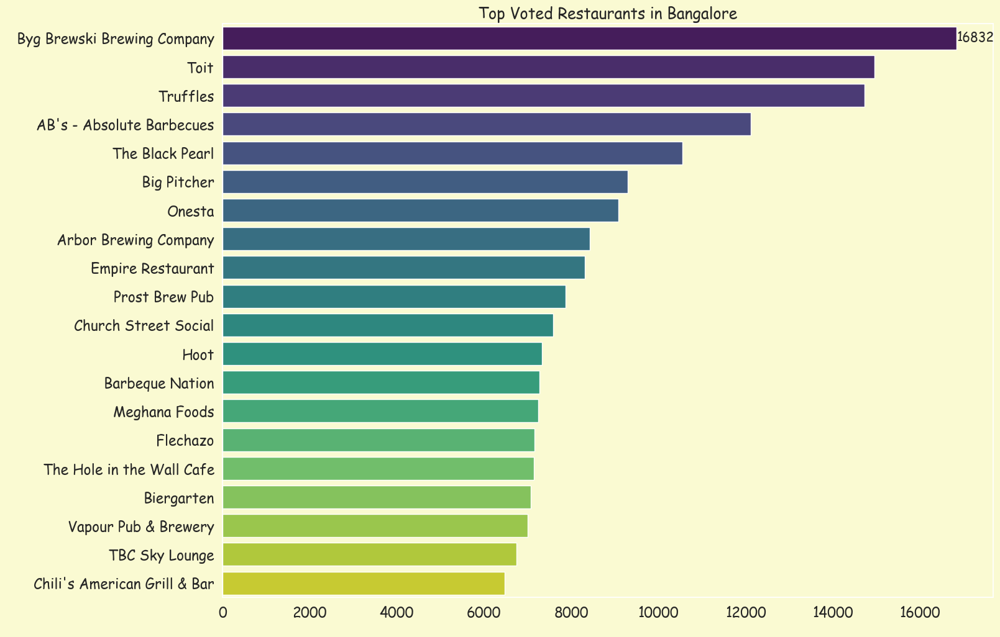

In [79]:
vote_dataset = df.copy(deep=True)
vote_dataset = vote_dataset.sort_values(by=['Votes'], ascending=False)
vote_dataset = vote_dataset.drop_duplicates(subset=['Restaurant Name'], keep='first').reset_index()
vote_dataset = vote_dataset.head(20)

plt.figure(figsize=(16, 12))
vote_plt = sns.barplot(x='Votes', y='Restaurant Name', palette='viridis', data=vote_dataset)
vote_plt.bar_label(vote_plt.containers[0], label=vote_dataset['Votes'])
plt.title('Top Voted Restaurants in Bangalore')
plt.show()

In [80]:
cuisine_dataset = df.copy(deep=True)
cuisine_dataset['Cuisines'] = cuisine_dataset['Cuisines'].apply(lambda x:x.split(','))
cuisine_dataset = cuisine_dataset.explode('Cuisines')
cuisine_dataset['Cuisines'] = cuisine_dataset['Cuisines'].apply(lambda x:x.replace(' ', ''))
cuisine_dataset = cuisine_dataset.groupby('Cuisines').aggregate({'Votes': list, 'Location': list})
cuisine_dataset['count'] = cuisine_dataset['Votes'].apply(lambda x:len(x))
cuisine_dataset['top_votes'] = cuisine_dataset['Votes'].apply(lambda x:max(x))
cuisine_dataset = cuisine_dataset.sort_values(by=['count', 'top_votes'], ascending=False).reset_index()
cuisine_dataset = cuisine_dataset.head(10)
cuisine_dataset

,Cuisines,Votes,Location,count,top_votes
0,NorthIndian,"[775, 787, 88, 166, 286, 8, 62, 148, 506, 415,...","[Banashankari, Banashankari, Banashankari, Bas...",17212,16832
1,Chinese,"[775, 787, 8, 164, 133, 144, 13, 148, 506, 91,...","[Banashankari, Banashankari, Mysore Road, Bana...",12859,8304
2,SouthIndian,"[88, 8, 75, 4884, 17, 28, 618, 34, 558, 28, 39...","[Banashankari, Mysore Road, Banashankari, Jaya...",6357,16832
3,FastFood,"[133, 180, 28, 62, 4, 23, 148, 506, 415, 91, 1...","[Banashankari, Banashankari, Banashankari, Ban...",6324,3854
4,Continental,"[324, 150, 164, 424, 133, 13, 36, 1047, 627, 8...","[Banashankari, Banashankari, Banashankari, Ban...",5197,16832
5,Biryani,"[415, 230, 804, 618, 627, 104, 163, 6, 520, 28...","[Banashankari, Banashankari, Kumaraswamy Layou...",5018,7238
6,Cafe,"[918, 2556, 324, 504, 402, 150, 164, 424, 918,...","[Banashankari, Banashankari, Banashankari, Ban...",4785,14726
7,Desserts,"[35, 345, 17, 39, 146, 66, 7, 71, 13, 8, 25, 4...","[Banashankari, Banashankari, Banashankari, Ban...",4506,5448
8,Beverages,"[504, 180, 4, 28, 17, 71, 146, 71, 175, 438, 2...","[Banashankari, Banashankari, Banashankari, Vij...",3836,3760
9,Italian,"[918, 2556, 324, 504, 150, 164, 918, 144, 93, ...","[Banashankari, Banashankari, Banashankari, Ban...",3177,16832


Most popular cuisines in Bangalore

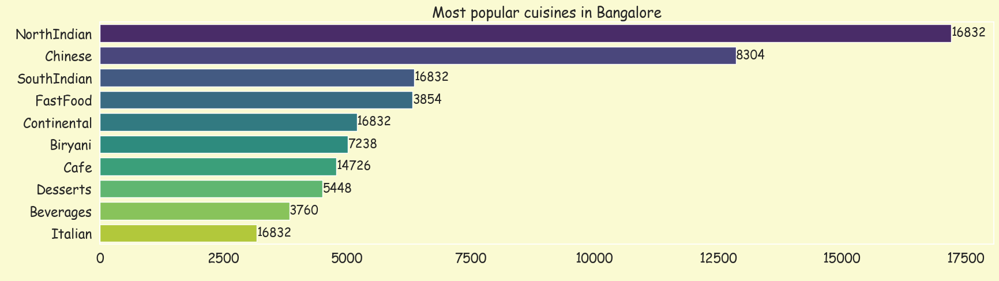

In [141]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(20, 5))

cuisine_plt = sns.barplot(
    x='count', y='Cuisines',
    data=cuisine_dataset,
    palette='viridis'
)

for bar, label in zip(cuisine_plt.patches, cuisine_dataset['top_votes']):
    height = bar.get_width()
    cuisine_plt.text(
        height + 1,                  # x position
        bar.get_y() + bar.get_height() / 2,  # y position (center of bar)
        label,
        va='center'
    )

plt.title('Most popular cuisines in Bangalore')
plt.show()


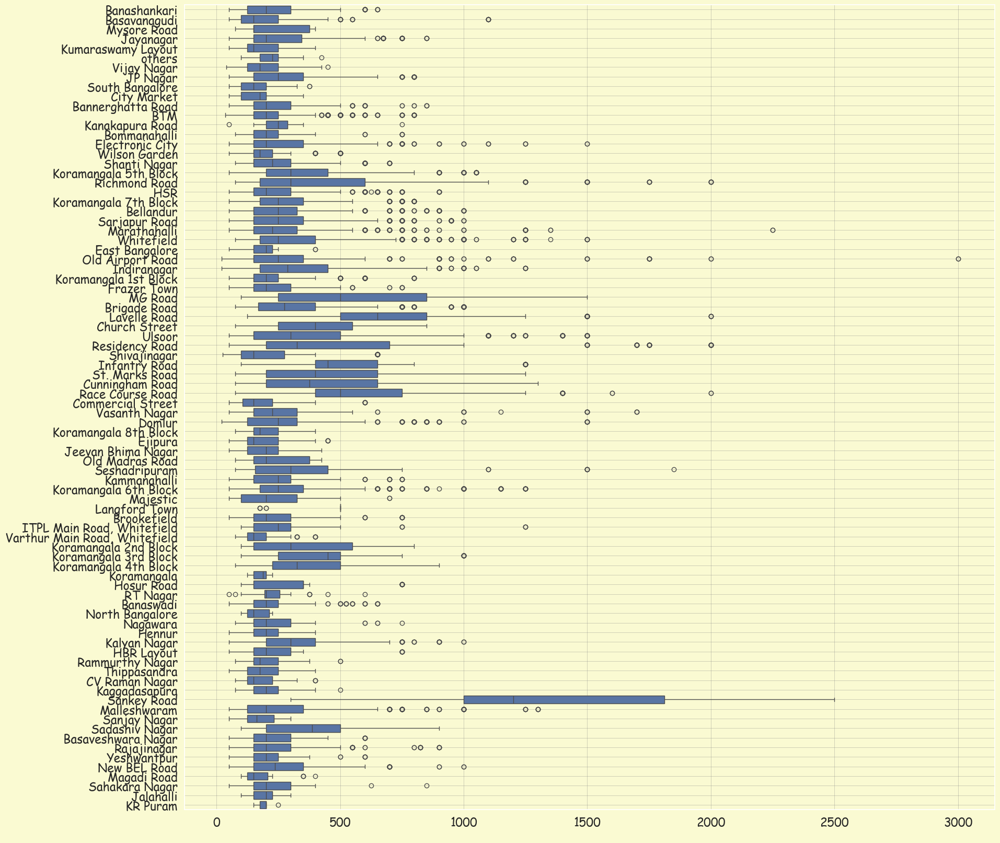

In [82]:
fig = plt.figure(figsize=(20,20))
sns.boxplot(data=df, y="Location", x="Cost Per Head",color="#4C72B0")
plt.grid(True, color = "grey", linewidth = "0.5", alpha=0.5, axis="both")
plt.ylabel("")
plt.show()

In [83]:
from IPython.core.display import HTML

def value_counts_all(df, columns):
    pd.set_option('display.max_rows', 50)
    table_list = []
    for col in columns:
        table_list.append(pd.DataFrame(df[col].value_counts()))
    return HTML(
        f"<table><tr> {''.join(['<td>' + table._repr_html_() + '</td>' for table in table_list])} </tr></table>")

value_counts_all(df, ["Location","Listed in City","Restaurant Name","Cuisines","Catagory"])

,count
Location,
BTM,3879
Koramangala 5th Block,2297
HSR,1993
Indiranagar,1800
JP Nagar,1710
...,...
Old Madras Road,22
Kanakapura Road,19
Mysore Road,17


Top 15 Best Liked cuisines in Bangalore

In [84]:
print('\033[7m'+'.: Cuisines :.')
print('\033[0m\033[43m*' * 47 +'\033[0m')
df['Cuisines'].value_counts()[0:15]

.: Cuisines :.
***********************************************


Cuisines
North Indian                           2108
North Indian, Chinese                  1953
South Indian                           1232
Cafe                                    620
Bakery, Desserts                        613
Biryani                                 600
South Indian, North Indian, Chinese     561
Desserts                                545
Fast Food                               514
Chinese                                 410
Ice Cream, Desserts                     384
Bakery                                  377
Chinese, North Indian                   335
Mithai, Street Food                     317
North Indian, Chinese, Biryani          260
Name: count, dtype: int64

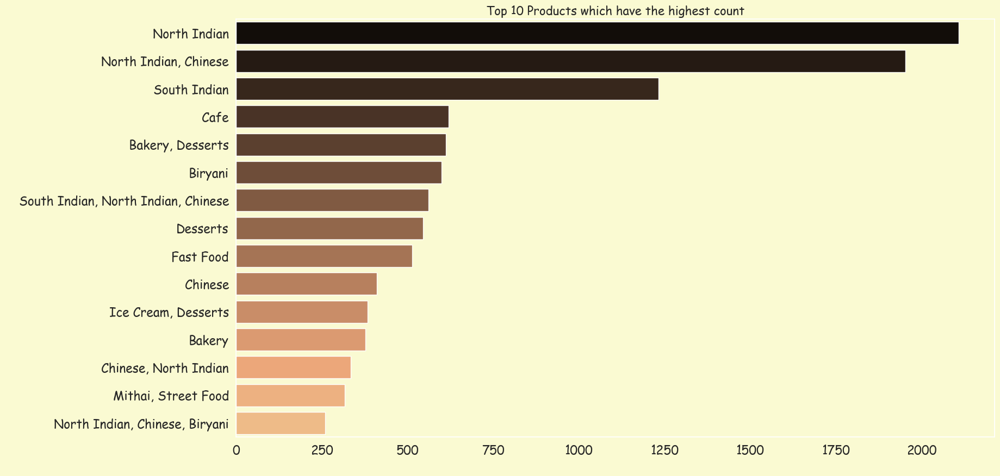

In [85]:
# Top 15 Cuisines which have the highest Order

plt.figure(figsize=(18, 10))
sns.countplot(y='Cuisines', data=df, order=df['Cuisines'].value_counts().head(15).index, palette='copper')
plt.title('Top 10 Products which have the highest count', fontsize=16)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Product Name', fontsize=12)

plt.show()

PieChat for Category of Food Bangalore

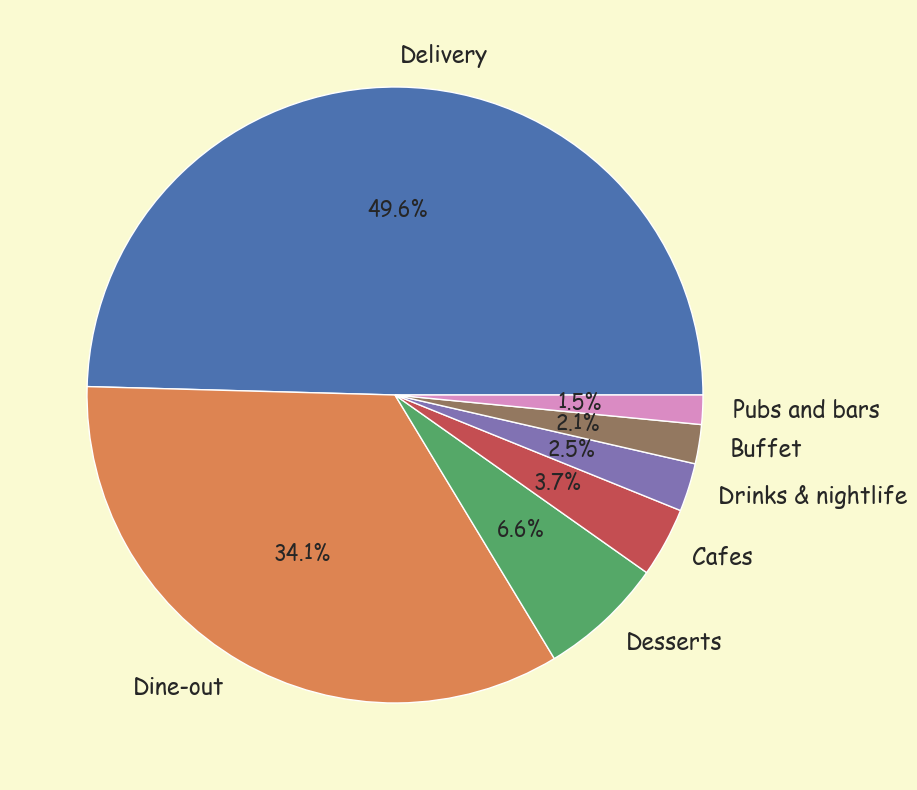

In [86]:
plt.figure(figsize=(20,10))
plt.pie(df['Catagory'].value_counts(),labels=df["Catagory"].value_counts().keys(),autopct="%0.1f%%")
plt.show()

Top 50 Location in Bangalore with total Collection (Cost per Head)

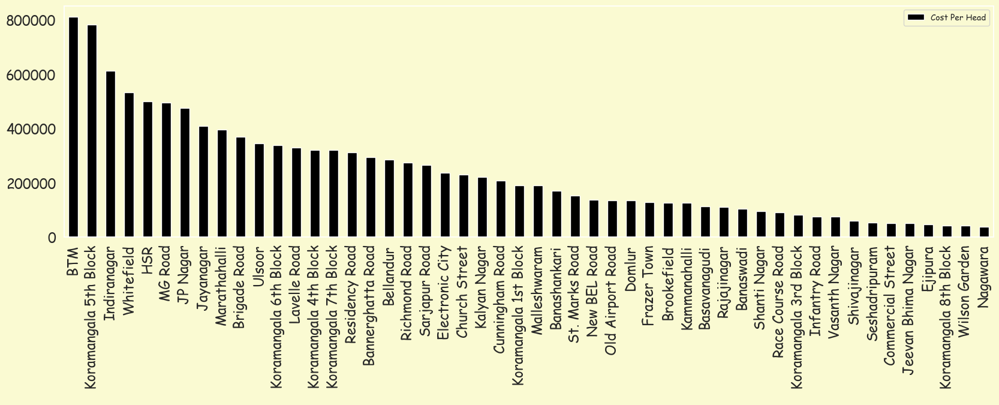

In [87]:
df.groupby(['Location']).sum()[['Cost Per Head']].sort_values(by="Cost Per Head",ascending=False).nlargest(n=50, columns=['Cost Per Head']).plot.bar(color=plt.cm.copper(np.linspace(0, 1, 10)),figsize=(20,5))
plt.show();

In [88]:
top_sp = df.groupby('Location', as_index=True)['Cost Per Head'].sum().to_frame()
top = top_sp.sort_values('Cost Per Head', ascending=False)[:10]
top.style.background_gradient(cmap='copper').format(precision=2)


,Cost Per Head
Location,
BTM,810780.00
Koramangala 5th Block,781800.00
Indiranagar,611520.00
Whitefield,532750.00
HSR,499735.00
MG Road,493450.00
JP Nagar,474875.00
Jayanagar,408825.00
Marathahalli,394175.00


Top 50 Location in Bangalore with Average Cost per Head

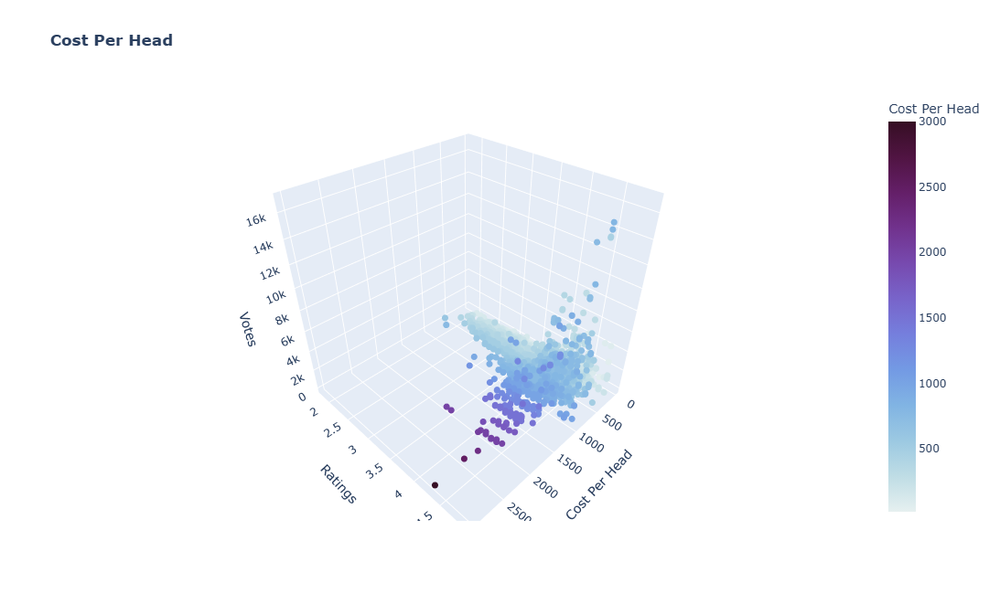

In [92]:
import plotly.graph_objects as go
import plotly.express as px
from PIL import Image, ImageEnhance; Image.MAX_IMAGE_PIXELS = 5_000_000_000;
import plotly
import PIL

fig = px.scatter_3d(df, x='Cost Per Head', y='Ratings', z='Votes', color="Cost Per Head",
                    opacity=1, width=700, height=650, 
                    color_continuous_scale='dense',
                    title="<b>Cost Per Head</b>")
fig.update_traces(marker_size=4)
fig.show()

Summary of Top 15 Cuisines in Bangalore

In [139]:
Summary_df.sort_values(by='Cost Per Head Mean', ascending=False)[:15] \
    .style.background_gradient(cmap='copper').format(precision=2)


,Cuisines,Ratings,Votes,Cost Per Head Mean,Cost Per Head Sum
1237,"French, Italian",4.30,127.00,3000.00,6000.00
1808,"North Indian, Continental, Japanese, Chinese, South Indian",4.10,309.00,2050.00,8200.00
2277,"Steak, Mediterranean, Grill",3.44,12.00,2000.00,10000.00
1856,"North Indian, Kashmiri, Mughlai",4.00,134.00,1850.00,1850.00
1485,"Mangalorean, Konkan, Seafood, Kerala",4.50,678.60,1750.00,8750.00
1846,"North Indian, Italian, Asian, Continental, Mediterranean",4.20,593.25,1750.00,7000.00
2344,"Thai, Japanese, Chinese",4.15,246.00,1750.00,3500.00
1849,"North Indian, Italian, Chinese, Japanese",4.30,429.00,1700.00,5100.00
1818,"North Indian, European, Thai",4.30,618.10,1700.00,17000.00
1000,"Continental, North Indian, Italian, Chinese",4.00,344.00,1500.00,3000.00


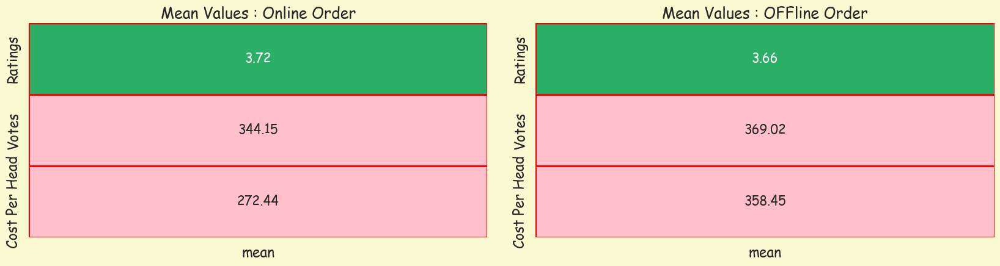

In [95]:
yes = df[df['Online Order'] == 'Yes'].describe().T
no = df[df['Online Order'] == 'No'].describe().T

colors = ['#2BAE66','pink']

fig,ax = plt.subplots(nrows = 1,ncols = 2,figsize = (17,5))
plt.subplot(1,2,1)
sns.heatmap(yes[['mean']],annot = True,cmap = colors,linewidths = 0.8,linecolor = 'Red',cbar = False,fmt = '.2f')
plt.title('Mean Values : Online Order');

plt.subplot(1,2,2)
sns.heatmap(no[['mean']],annot = True,cmap = colors,linewidths = 0.8,linecolor = 'Red',cbar = False,fmt = '.2f')
plt.title('Mean Values : OFFline Order');

fig.tight_layout(pad = 2)

Creating New Feature Cost Per Head Range

In [138]:
df['Cost_Per_Head_Range'] = pd.cut(
    df['Cost Per Head'],
    bins=[0, 50, 250, 500, 1000, 2000, 3000],
    labels=['Very Low', 'Low', 'Medium', "Average", 'High', "Very High"]
)

df['Cost_Per_Head_Range'].value_counts(ascending=False).to_frame() \
    .style.background_gradient(cmap='copper').format(precision=2)


,count
Cost_Per_Head_Range,
Low,23810
Medium,11666
Average,4518
Very Low,652
High,608
Very High,9


Creating New Feature Ratings_Grade

In [137]:
def Grade(Ratings):
    if Ratings >= 4.5:
        return 'O'
    if Ratings >= 4:
        return 'A'
    if Ratings >= 3.5:
        return 'B'
    if Ratings >= 3:
        return 'C'
    if Ratings >= 2.5:
        return 'D'
    if Ratings >= 2.0:
        return 'E'
    return 'F'

df['Ratings_Grade'] = df.apply(lambda x: Grade(x['Ratings']), axis=1)

df.head().style.background_gradient(cmap='copper').format(precision=2)


,Restaurant Name,Online Order,Book Table,Ratings,Votes,Location,Type Of Restaurant,Cuisines,Cost Per Head,Catagory,Listed in City,Cost_Per_Head_Range,Ratings_Grade
14819,Srinidhi Sagar Food Line,Yes,No,3.70,131,Indiranagar,Quick Bites,"South Indian, North Indian, Chinese",20.00,Delivery,Frazer Town,Very Low,B
29785,Srinidhi Sagar Deluxe,Yes,No,3.60,108,Domlur,Quick Bites,"South Indian, North Indian, Chinese",20.00,Delivery,Koramangala 5th Block,Very Low,B
18891,Srinidhi Sagar Food Line,Yes,No,3.70,129,Indiranagar,Quick Bites,"South Indian, North Indian, Chinese",20.00,Dine-out,Indiranagar,Very Low,B
17773,Srinidhi Sagar,Yes,No,3.90,160,Old Airport Road,Quick Bites,"South Indian, North Indian, Chinese",20.00,Delivery,Indiranagar,Very Low,B
32485,Srinidhi Sagar,Yes,No,3.90,162,Old Airport Road,Quick Bites,"South Indian, North Indian, Chinese",20.00,Delivery,Koramangala 6th Block,Very Low,B


In [136]:
pd.set_option('display.float_format', '{:.2f}'.format)

df.groupby('Location')['Cost Per Head'] \
  .agg(['count', 'mean', 'sum']) \
  .sort_values(by='sum', ascending=False) \
  .head(10) \
  .style.background_gradient(cmap='copper') \
  .format(precision=2)


,count,mean,sum
Location,,,
BTM,3879,209.02,810780.00
Koramangala 5th Block,2297,340.36,781800.00
Indiranagar,1800,339.73,611520.00
Whitefield,1568,339.76,532750.00
HSR,1993,250.75,499735.00
MG Road,793,622.26,493450.00
JP Nagar,1710,277.70,474875.00
Jayanagar,1634,250.20,408825.00
Marathahalli,1410,279.56,394175.00


In [135]:
pd.set_option('display.float_format', '{:.2f}'.format)

df.groupby('Catagory')['Cost Per Head'] \
  .agg(['count', 'mean', 'sum']) \
  .sort_values('sum') \
  .head(10) \
  .style.background_gradient(cmap='copper') \
  .format(precision=2)


,count,mean,sum
Catagory,,,
Pubs and bars,632,668.35,422400.00
Cafes,1511,323.21,488375.00
Desserts,2709,204.56,554145.00
Buffet,848,658.31,558250.00
Drinks & nightlife,1045,727.39,760125.00
Dine-out,14066,327.70,4609450.00
Delivery,20452,247.75,5066908.00


In [134]:
df2 = df.groupby('Restaurant Name')[
    ['Catagory', 'Cuisines', 'Cost_Per_Head_Range', 'Listed in City',
     'Online Order', 'Location', 'Type Of Restaurant', 'Ratings_Grade']
].nunique().sort_values(by='Cuisines', ascending=False).reset_index()

df2[:10].style.background_gradient(cmap='copper').format(precision=2)


,Restaurant Name,Catagory,Cuisines,Cost_Per_Head_Range,Listed in City,Online Order,Location,Type Of Restaurant,Ratings_Grade
0,Sri Krishna Sagar,2,7,1,16,2,9,3,2
1,Chung Wah,2,7,2,27,2,14,3,4
2,New Shanthi Sagar,3,6,2,12,2,10,3,3
3,Lassi Shop,2,6,2,29,2,21,4,3
4,Imperial Restaurant,2,6,1,17,1,7,1,2
5,Petoo,2,5,2,25,2,14,3,2
6,Smoke - The Sizzler House,2,5,2,16,2,6,2,4
7,RS Shiv Sagar,2,5,2,9,1,4,1,2
8,Andhra Ruchulu,2,5,2,13,2,6,4,3
9,Chef Baker's,4,5,2,16,1,10,3,4


Top 10 Most Liked Cuisines in Bangalore

In [101]:
print(f"\033[034m\033[1m")
sport=df['Cuisines'].value_counts()[:10]
print(sport)


Cuisines
North Indian                           2108
North Indian, Chinese                  1953
South Indian                           1232
Cafe                                    620
Bakery, Desserts                        613
Biryani                                 600
South Indian, North Indian, Chinese     561
Desserts                                545
Fast Food                               514
Chinese                                 410
Name: count, dtype: int64


In [102]:
Dine_out=df[df['Catagory'] == 'Dine-out']['Location'].value_counts().sort_values(ascending=False).head()
Dine_out

Location
BTM                      1195
Koramangala 5th Block     790
Whitefield                590
JP Nagar                  555
Jayanagar                 486
Name: count, dtype: int64

In [103]:
Delivery=df[df['Catagory'] == 'Delivery']['Location'].value_counts().sort_values(ascending=False).head()
Delivery

Location
BTM                      2438
HSR                      1351
Koramangala 5th Block     966
Indiranagar               963
Jayanagar                 904
Name: count, dtype: int64

In [104]:
Buffet=df[df['Catagory'] == 'Buffet']['Location'].value_counts().sort_values(ascending=False).head()
Buffet

Location
Richmond Road            63
Koramangala 5th Block    60
MG Road                  51
JP Nagar                 42
Indiranagar              36
Name: count, dtype: int64

In [105]:
City=df.groupby(['Listed in City', 'Online Order'])['Catagory'].count().reset_index().head(10)
City

,Listed in City,Online Order,Catagory
0,BTM,No,732
1,BTM,Yes,1854
2,Banashankari,No,212
3,Banashankari,Yes,515
4,Bannerghatta Road,No,348
5,Bannerghatta Road,Yes,860
6,Basavanagudi,No,337
7,Basavanagudi,Yes,735
8,Bellandur,No,251
9,Bellandur,Yes,705


In [127]:
df.groupby('Cuisines')['Cost Per Head'] \
  .count() \
  .nlargest(20) \
  .reset_index() \
  .head(10) \
  .style.background_gradient(cmap='copper') \
  .format(precision=2)


,Cuisines,Cost Per Head
0,North Indian,2108
1,"North Indian, Chinese",1953
2,South Indian,1232
3,Cafe,620
4,"Bakery, Desserts",613
5,Biryani,600
6,"South Indian, North Indian, Chinese",561
7,Desserts,545
8,Fast Food,514
9,Chinese,410


In [128]:
Online = df.groupby(['Online Order', 'Catagory'])[['Cost Per Head', 'Ratings']].mean().reset_index()

Online.style.background_gradient(cmap='copper').format(precision=2)


,Online Order,Catagory,Cost Per Head,Ratings
0,No,Buffet,706.10,3.91
1,No,Cafes,326.66,3.80
2,No,Delivery,235.93,3.53
3,No,Desserts,194.34,3.68
4,No,Dine-out,371.50,3.64
5,No,Drinks & nightlife,734.85,3.97
6,No,Pubs and bars,680.48,3.96
7,Yes,Buffet,589.66,4.09
8,Yes,Cafes,320.52,3.93
9,Yes,Delivery,250.56,3.69


In [129]:
pd.crosstab(df['Location'], df['Online Order'])[:10] \
  .style.background_gradient(cmap='copper') \
  .format(precision=2)


Online Order,No,Yes
Location,,
BTM,1018,2861
Banashankari,273,471
Banaswadi,171,297
Bannerghatta Road,398,828
Basavanagudi,183,412
Basaveshwara Nagar,46,87
Bellandur,331,666
Bommanahalli,53,91
Brigade Road,442,610


In [130]:
x = pd.DataFrame(
    pd.pivot_table(df, index=['Online Order', 'Catagory'], aggfunc='count')['Cost Per Head']
)

x.style.background_gradient(cmap='copper').format(precision=2)


In [132]:
df.groupby('Location')[['Cost Per Head']] \
  .mean() \
  .sort_values(by='Cost Per Head', ascending=False) \
  .reset_index() \
  .head(10) \
  .style.background_gradient(cmap='copper') \
  .format(precision=2)


,Location,Cost Per Head
0,Sankey Road,1291.35
1,Lavelle Road,682.69
2,Race Course Road,660.74
3,MG Road,622.26
4,Infantry Road,536.43
5,Residency Road,515.02
6,Richmond Road,451.61
7,St. Marks Road,441.84
8,Langford Town,441.67
9,Cunningham Road,433.58


In [133]:
df.groupby('Location')[['Cost Per Head']] \
  .sum() \
  .sort_values(by='Cost Per Head', ascending=False) \
  .reset_index() \
  .head(10) \
  .style.background_gradient(cmap='copper') \
  .format(precision=2)


,Location,Cost Per Head
0,BTM,810780.00
1,Koramangala 5th Block,781800.00
2,Indiranagar,611520.00
3,Whitefield,532750.00
4,HSR,499735.00
5,MG Road,493450.00
6,JP Nagar,474875.00
7,Jayanagar,408825.00
8,Marathahalli,394175.00
9,Brigade Road,367870.00


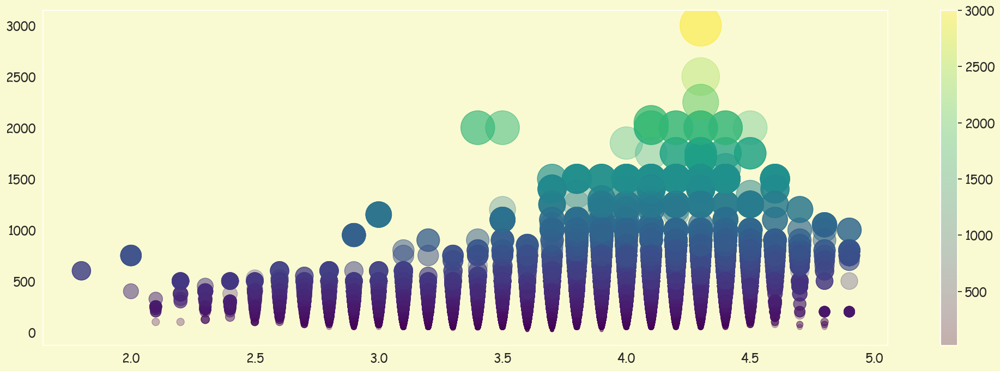

In [112]:
x = df["Ratings"]
y = df["Cost Per Head"]
colors = df["Cost Per Head"]
sizes = df["Cost Per Head"]

plt.figure(figsize = (25, 8))
plt.ticklabel_format(style = 'plain')
plt.scatter(x, y, c = colors, s = sizes, alpha = 0.3, cmap = 'viridis')
plt.colorbar();

Pairplot

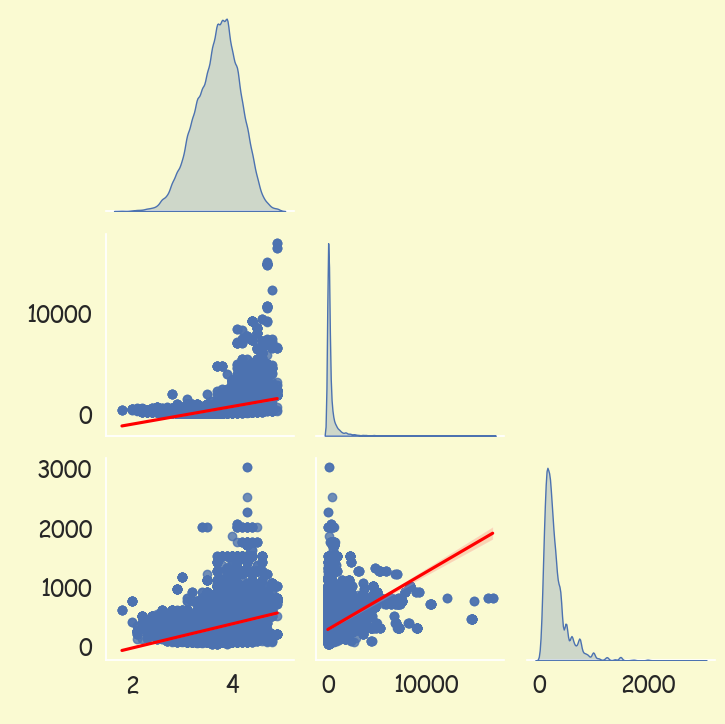

In [114]:
sns.pairplot(df,kind="reg",diag_kind='kde',plot_kws={'line_kws':{'color':'red'}},corner=True)
plt.tight_layout()
plt.show()

BarPlot of Catagory

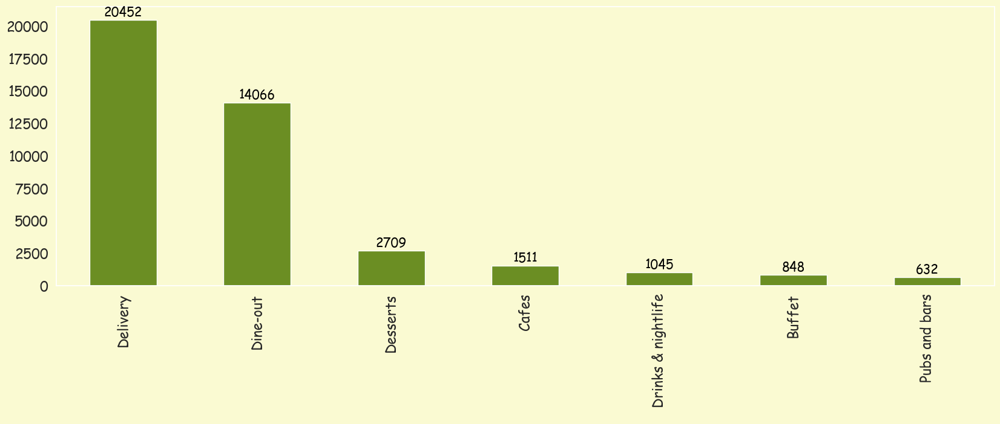

In [115]:
plt.figure(figsize = (20, 6))
ax = df.Catagory.value_counts().plot(kind = 'bar', color = 'olivedrab')

for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() + 0.25, p.get_height() + 1), ha = 'center', va = 'bottom', color = 'black')

BarPlot of Cuisines

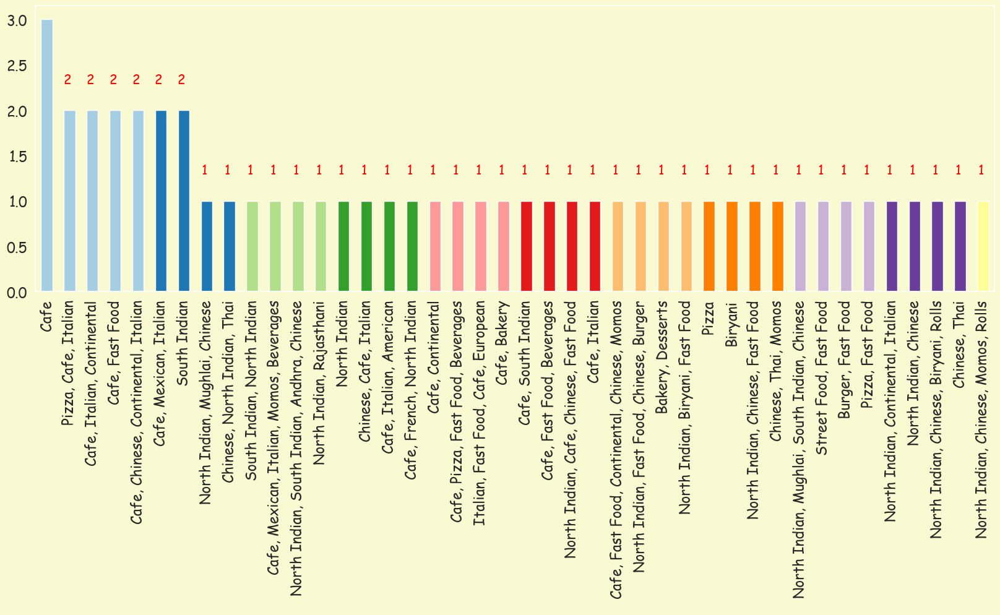

In [116]:
plt.figure(figsize = (20, 6))
ax = df.Cuisines[0:50].value_counts().plot(kind = 'bar', color = plt.cm.Paired(np.linspace(0, 1, 50)))

for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() + 0.15, p.get_height() + .25), ha = 'center', va = 'bottom', color = 'Red')

BarPlot of Cuisines Vs Cost Per Head

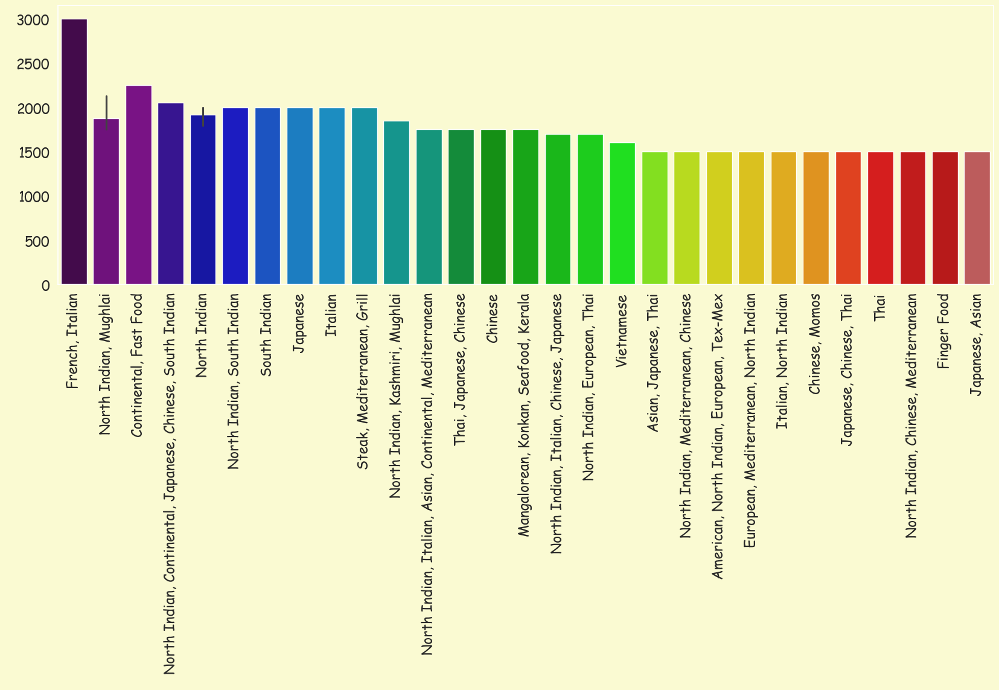

In [117]:
plt.figure(figsize = (20, 6))
plt.xticks(rotation = 90)
plt.ticklabel_format(style = 'plain')
df.sort_values("Cost Per Head", axis = 0, ascending = False, inplace = True)
sns.barplot(x = df["Cuisines"][1:100],
            y = df["Cost Per Head"][1:100],
            palette = "nipy_spectral");

BarPlot of Cost Per Head Vs Type Of Restaurant

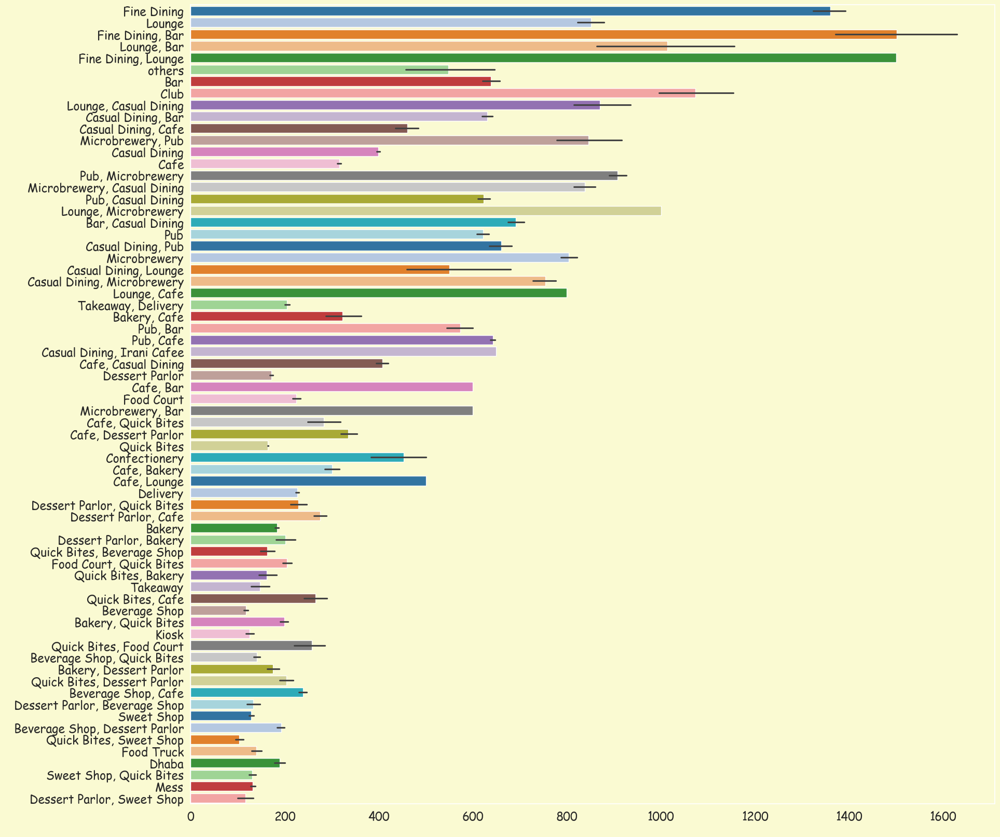

In [118]:
plt.figure(figsize = (20, 20))
plt.ticklabel_format(style = 'plain')
sns.barplot(y = df["Type Of Restaurant"], x = df["Cost Per Head"], palette = "tab20");

PieChat of Cuisines Liked in Bangalore

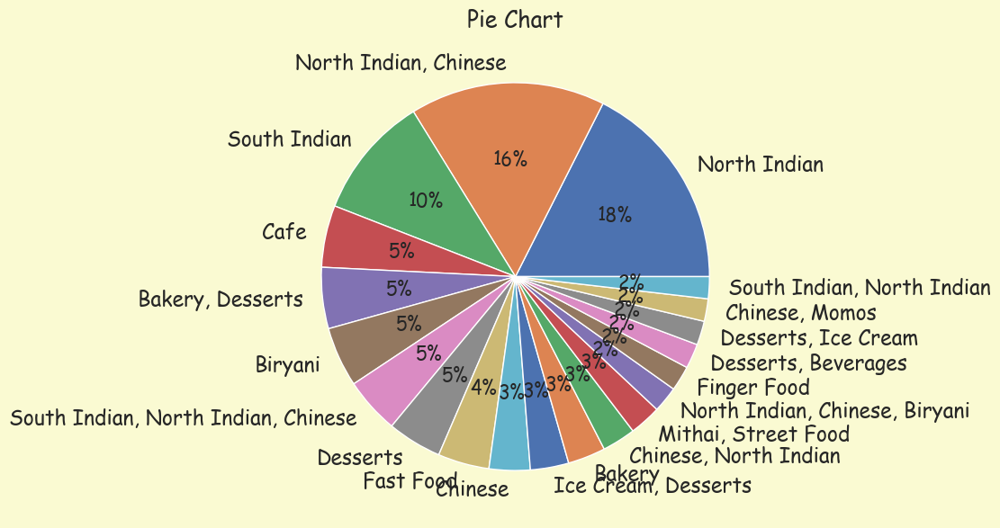

In [119]:
df["Cuisines"].value_counts()[:20].plot.pie(figsize = (7, 7),
                                             autopct = '%1.0f%%')
plt.title("Pie Chart")
plt.xticks(rotation = 90)
plt.show()

Barplot of Cost Per Head Vs Listed in City

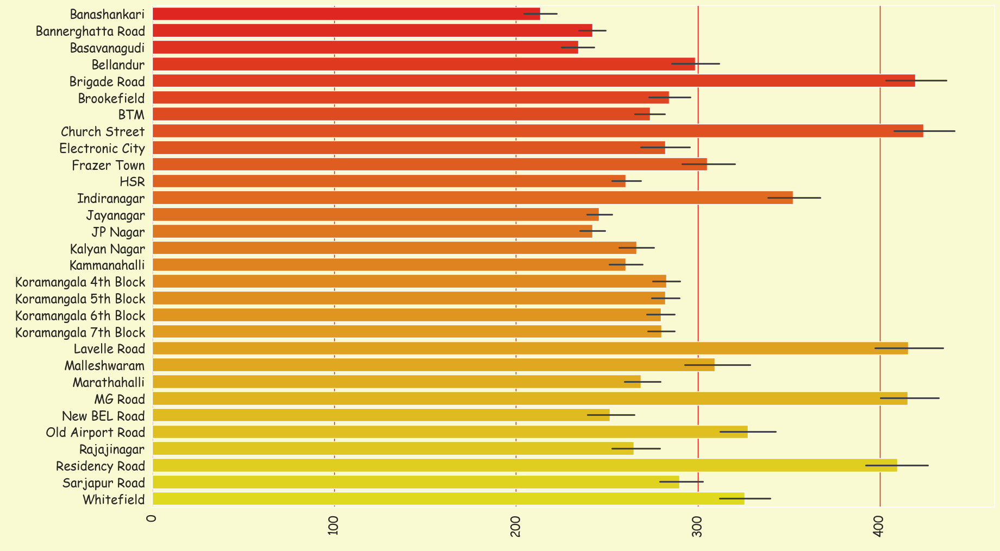

In [120]:
plt.figure(figsize = (20, 12))
plt.grid()
plt.xticks(rotation = 90)
plt.ticklabel_format(style = 'plain')
df.sort_values("Listed in City", axis = 0,
                         ascending = False,
                         inplace = True)
sns.barplot(x = df["Cost Per Head"][:40000],
            y = df["Listed in City"],
            palette = "autumn");

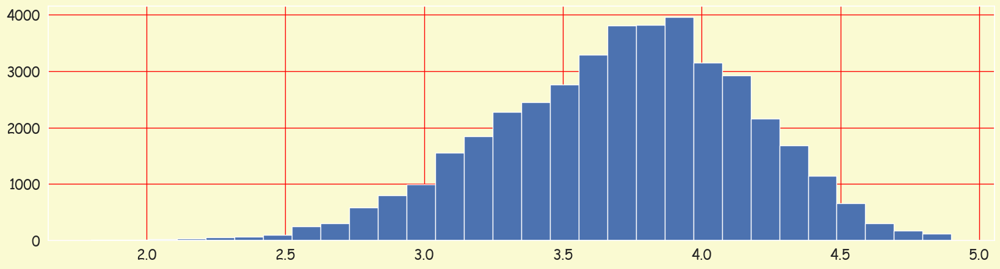

In [121]:
n_bins = 30
plt.figure(figsize = (20, 5))
df["Ratings"].hist(bins = n_bins);

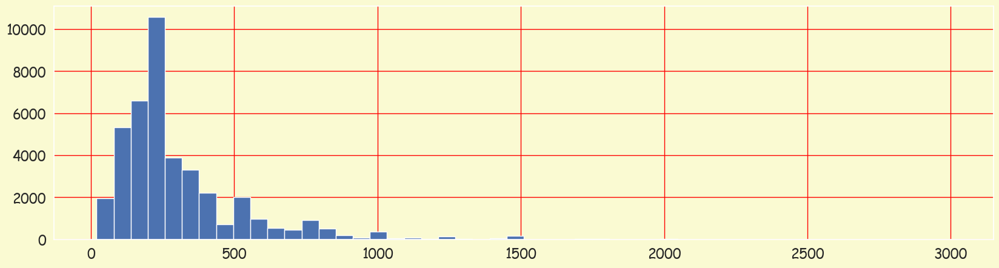

In [122]:
n_bins = 50
plt.figure(figsize = (20, 5))
df["Cost Per Head"].hist(bins = n_bins);

In [123]:
df['Ratings_Grade'].value_counts()

Ratings_Grade
B    17636
A    11057
C     9110
D     2033
O     1244
E      178
F        5
Name: count, dtype: int64

PieChat of Ratings_Grade

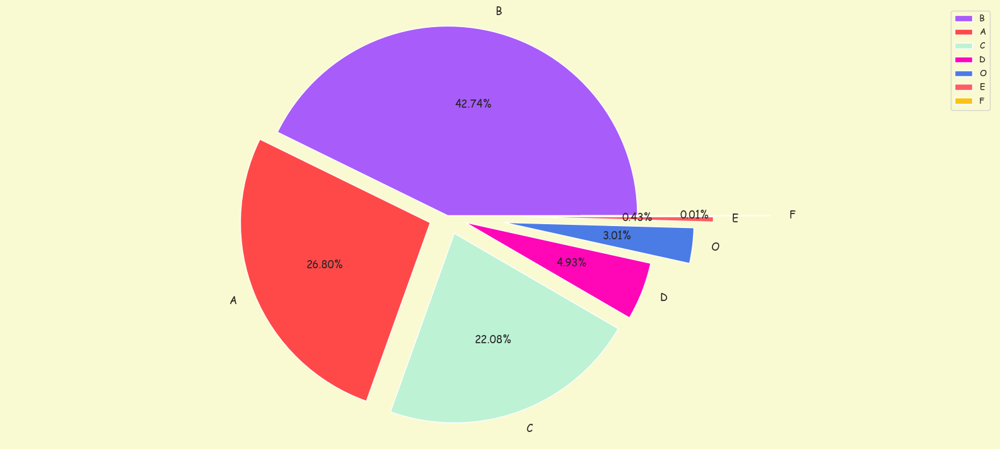

In [124]:
plt.figure(figsize = (20, 9))

counts = df["Ratings_Grade"].value_counts()
explode = (0, 0.1, 0.1, 0.1,0.3,0.4,0.7)
colors = ['#A85CF9', '#FF4949', '#BDF2D5', '#FF06B7', '#4B7BE5', '#FF5D5D', '#FAC213', '#37E2D5', '#6D8B74', '#E9D5CA', '#F77E21']

counts.plot(kind = 'pie', fontsize = 12, colors = colors, explode = explode, autopct = '%1.2f%%')
plt.axis('equal')
plt.legend(labels = counts.index, loc = "best")
plt.show()

Barplot of Location

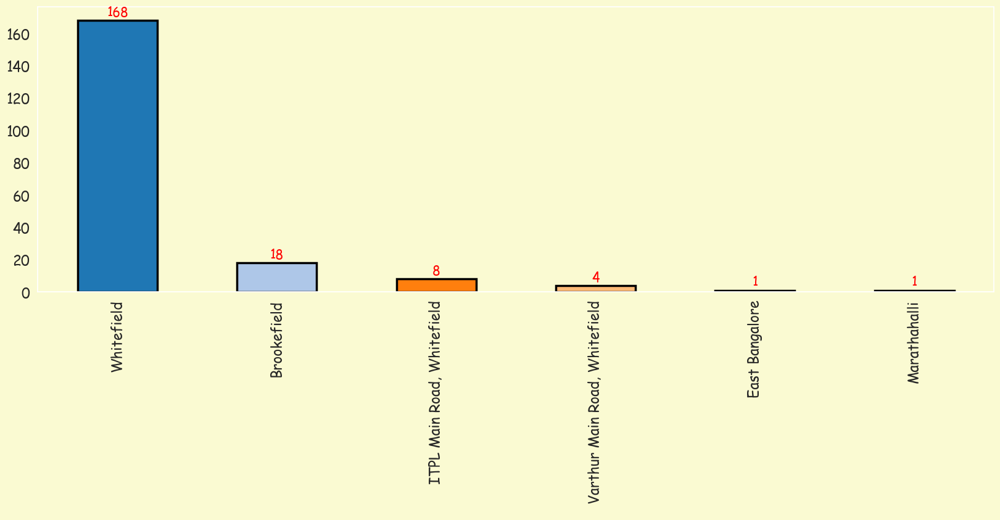

In [125]:
plt.figure(figsize = (20, 6))
col_map = plt.get_cmap('tab20')
ax = df["Location"][:200].value_counts().plot(kind = 'bar',
                                             color = col_map.colors,
                                             rot = 0, edgecolor = 'Black',
                                             linewidth = 2.5)
plt.xticks(rotation=90)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() + 0.25, p.get_height() + .25), ha = 'center', va = 'bottom', color = 'Red')

Barplot of Restaurant Name Vs Cost Per Head

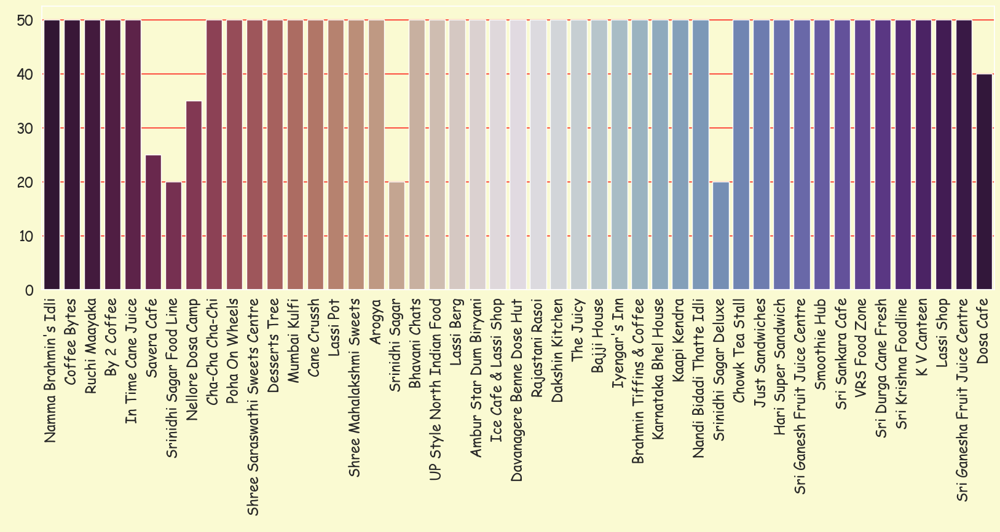

In [126]:
# Bar Plot for Restaurant Name Vs Top 100 Lowest Cost Per Head
plt.figure(figsize = (20, 6))
plt.grid()
plt.xticks(rotation = 90)
plt.ticklabel_format(style = 'plain')
df.sort_values("Cost Per Head", axis = 0, ascending = True, inplace = True)
sns.barplot(x = df["Restaurant Name"][:70], y = df["Cost Per Head"], palette = "twilight_shifted_r");